# Scratch Implementation

Import necessary libraries - Numpy, Pandas, Matplotlib and Seaborn 

In [410]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### Data loading, Pre-processing and Splitting

Load the CSV into dataframe using ```pandas.read_csv``` method.

In [411]:
df=pd.read_csv("Heart Disease.csv")
df

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,HeartDisease
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4233,1,50,1.0,1,1.0,0.0,0,1,0,313.0,179.0,92.0,25.97,66.0,86.0,1
4234,1,51,3.0,1,43.0,0.0,0,0,0,207.0,126.5,80.0,19.71,65.0,68.0,0
4235,0,48,2.0,1,20.0,NaN,0,0,0,248.0,131.0,72.0,22.00,84.0,86.0,0
4236,0,44,1.0,1,15.0,0.0,0,0,0,210.0,126.5,87.0,19.16,86.0,NaN,0


Checking the dataset distribution.

**Observation:** The dataset provided is highly imbalanced with the ratio of positive to negative samples as approximately 6:1.

In [412]:
print("Number of positive samples in the dataset:",np.sum(df["HeartDisease"]==1))
print("Number of negative samples in the dataset:",np.sum(df["HeartDisease"]==0))

Number of positive samples in the dataset: 644
Number of negative samples in the dataset: 3594


Looking at the data, we can differentiate the columns in two types based on the values they hold: **Numerical** and **Categorical**.

**Numerical columns** contain continuous values, representing measurable quantities. These values can take a wide range of numbers, making them suitable for mathematical operations and statistical analysis.

**Categorical columns** consist of discrete values, often representing labels or categories. These values classify data into specific groups or categories and are typically non-numeric, though they can also be represented numerically.

In [413]:
#check the column categories
categorical_columns=["male","currentSmoker","BPMeds","prevalentStroke","prevalentHyp","diabetes"]
numerical_columns= ["age","cigsPerDay","totChol","sysBP","diaBP","BMI","heartRate","glucose"]
indices_numerical=[df.columns.get_loc(i) for i in numerical_columns]

Working with an imbalanced dataset can cause the model to become biased towards the majority class. To address this, we need to balance the dataset. Our approach involves:

1. **Downsampling** the majority class from 3500 to 1000 instances through random sampling.
2. **Upsampling** the minority class to approximately 1000 instances by adding noise (data augmentation). The noise is sampled from a normal distribution with a variance of 0.1.


In [414]:

df_majority = df[df["HeartDisease"] == 0]
df_minority = df[df["HeartDisease"] == 1]

df_majority_downsampled = df_majority.sample(n=1000, random_state=42)

df_minority_x = df_minority.drop(columns=["HeartDisease"])
df_minority_y = df_minority["HeartDisease"]


df_minority_downsampled = df_minority.sample(n=400, random_state=42)
df_minority_downsampled_x = df_minority_downsampled.drop(columns=["HeartDisease"])
df_minority_downsampled_y = df_minority_downsampled["HeartDisease"]

# Add noise to the numerical columns of the minority data
for i in df_minority_downsampled_x.columns:
    if i in numerical_columns:
        df_minority_downsampled_x[i] = df_minority_downsampled_x[i] + np.random.normal(0, 0.1, df_minority_downsampled_x.shape[0])

# Combine the new minority data (with noise) with the existing minority data
df_minority_x = pd.concat([df_minority_x, df_minority_downsampled_x], ignore_index=True)
df_minority_y = pd.concat([df_minority_y, df_minority_downsampled_y], ignore_index=True)

# Add the 'HeartDisease' column back to df_minority_x
df_minority_x["HeartDisease"] = df_minority_y

# Combine the majority and minority DataFrames
df = pd.concat([df_majority_downsampled, df_minority_x])

# Shuffle the dataset and reset index
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

print("Shape of dataframe:",df.shape)
print("Number of positive samples:",np.sum(df["HeartDisease"]==1))
print("Number of negative samples:",np.sum(df["HeartDisease"]==0))


Shape of dataframe: (2044, 16)
Number of positive samples: 1044
Number of negative samples: 1000


Make the test-train-val split. It is necessary to split the dataset first so we have absolutely no clue about the test data. Test data, at all times, should be unseen.

In [415]:
#Split into train, val, test 70:15:15
df_train=df.sample(frac=0.7, random_state=42)
df_rest=df.loc[~df.index.isin(df_train.index)]

df_val=df_rest.sample(frac=0.5, random_state=42) 
df_test=df_rest.loc[~df_rest.index.isin(df_val.index)]

print("Length of training data:",len(df_train))
print("Length of validation data:",len(df_val))
print("Length of testing data:",len(df_test))

Length of training data: 1431
Length of validation data: 306
Length of testing data: 307


Having a look at the training dataframe

In [416]:
df_train

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,HeartDisease
305,1,41.000000,3.0,0,0.000000,0.0,0,1,0,230.000000,150.000000,101.000000,28.540000,75.000000,65.000000,0
1283,0,47.130242,2.0,0,0.088948,0.0,0,0,0,194.913234,126.016285,75.002865,NaN,60.128341,NaN,1
368,0,56.000000,1.0,1,40.000000,0.0,0,1,0,214.000000,147.000000,65.000000,17.680000,110.000000,87.000000,1
479,0,62.000000,1.0,0,0.000000,0.0,0,1,0,308.000000,152.000000,98.000000,35.420000,75.000000,76.000000,0
1537,0,38.000000,2.0,1,5.000000,0.0,0,0,0,195.000000,122.000000,84.500000,23.240000,75.000000,78.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
753,1,42.156920,2.0,1,29.986173,0.0,0,1,0,270.121615,129.463452,99.979912,30.237603,81.979604,87.906918,1
498,1,56.000000,NaN,1,25.000000,0.0,0,0,0,255.000000,138.000000,80.000000,23.440000,67.000000,79.000000,0
1276,1,44.000000,1.0,1,40.000000,0.0,0,0,0,158.000000,150.500000,87.000000,21.440000,75.000000,98.000000,1
1325,0,63.151828,2.0,0,-0.095914,0.0,0,1,0,250.145346,190.006389,87.925634,24.051214,94.110981,117.725140,1


**Getting insights into the distribution of the output classes**


In [417]:
print("People having disease:",np.sum(df_train["HeartDisease"]==1))
print("People not having disease:",np.sum(df_train["HeartDisease"]==0))

People having disease: 732
People not having disease: 699


The dataset contains NAN (*not a number*) values. Checking the number of NAN values in the datasets.

In [418]:
#total length- length of dataframe after dropping all the rows having null values = number of rows having null values
print("Training NAN values:",len(df_train)-len(df_train.dropna()))
print("Validation NAN values:",len(df_val)-len(df_val.dropna()))
print("Test NAN values:",len(df_test)-len(df_test.dropna()))


Training NAN values: 201
Validation NAN values: 39
Test NAN values: 44


Checking the column-wise NaN distribution in the training set. (Note: The validation and test sets remain untouched.)


In [419]:
#finding the number of null values in each column

print("=== Training Data NAN Values ===")
print(f"Column Name : Number of NAN values")
for i in df.columns:
    print(f"{i} : {np.sum(df_train[i].isna())}")

=== Training Data NAN Values ===
Column Name : Number of NAN values
male : 0
age : 0
education : 35
currentSmoker : 0
cigsPerDay : 9
BPMeds : 20
prevalentStroke : 0
prevalentHyp : 0
diabetes : 0
totChol : 15
sysBP : 0
diaBP : 0
BMI : 15
heartRate : 1
glucose : 129
HeartDisease : 0


`df.describe()` provides a summary of key statistical metrics (count, mean, std, min, max, quartiles) for numerical columns in the dataset.


In [420]:
#check the distribution of the data so that we can choose what to do with nan values
df_train.describe()

,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,HeartDisease
count,1431.000000,1431.000000,1396.000000,1431.000000,1422.000000,1411.000000,1431.000000,1431.000000,1431.000000,1416.000000,1431.000000,1431.000000,1416.000000,1430.000000,1302.000000,1431.000000
mean,0.487771,51.500825,1.915473,0.519217,9.989693,0.041106,0.011880,0.392034,0.039133,240.503424,136.923003,84.475147,26.009657,76.101334,84.536620,0.511530
std,0.500025,8.610775,1.022340,0.499805,12.592043,0.198605,0.108383,0.488375,0.193980,46.421422,24.763519,12.905316,4.196114,11.994125,30.596898,0.500042
min,0.000000,32.000000,1.000000,0.000000,-0.205467,0.000000,0.000000,0.000000,0.000000,107.012864,83.500000,48.000000,16.554818,47.000000,40.000000,0.000000
25%,0.000000,44.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,210.000000,120.000000,75.913505,23.080000,68.000000,71.959041,0.000000
50%,0.000000,51.940973,2.000000,1.000000,1.972904,0.000000,0.000000,0.000000,0.000000,238.000000,132.000000,83.000000,25.639430,75.000000,78.000000,1.000000
75%,1.000000,58.949507,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,266.044576,150.000000,92.000000,28.382490,84.000000,88.000000,1.000000
max,1.000000,69.984326,4.000000,1.000000,60.165452,1.000000,1.000000,1.000000,1.000000,600.000000,294.910106,139.897535,44.710000,143.000000,394.000000,1.000000


#### Visualizing data distribution with histograms and probability plots to select an appropriate method for replacing missing (NaN) values.


Plotting the **histograms** to visualize data distribution.

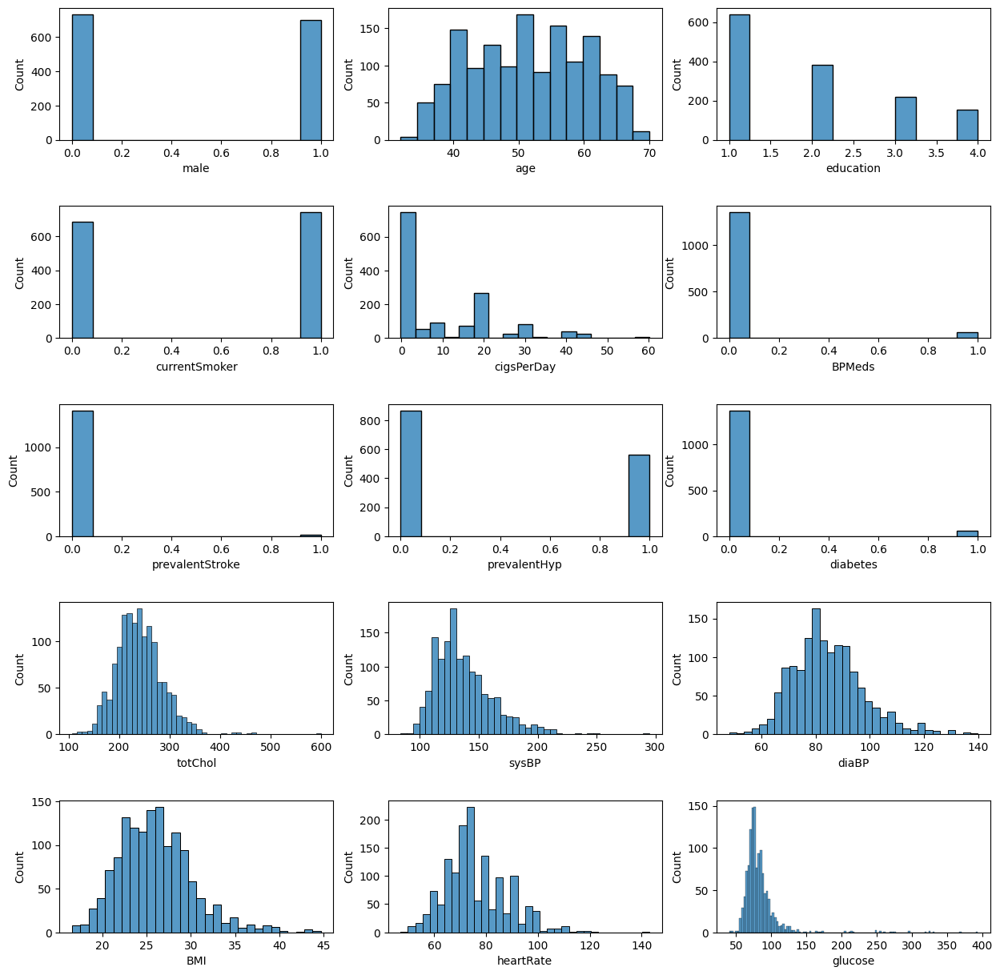

In [421]:
#plot histogram for each column to check the distribution of the data
#plot it in a single figure

fig, axes = plt.subplots(5, 3, figsize=(15, 15))
fig.subplots_adjust(hspace=0.5)

req_columns=df_train.columns.drop("HeartDisease")
for i, column in enumerate(req_columns):
    sns.histplot(df_train[column], ax=axes[i//3, i%3])
plt.show()
    


Plotting the **probability distributions** corresponding to the histograms.

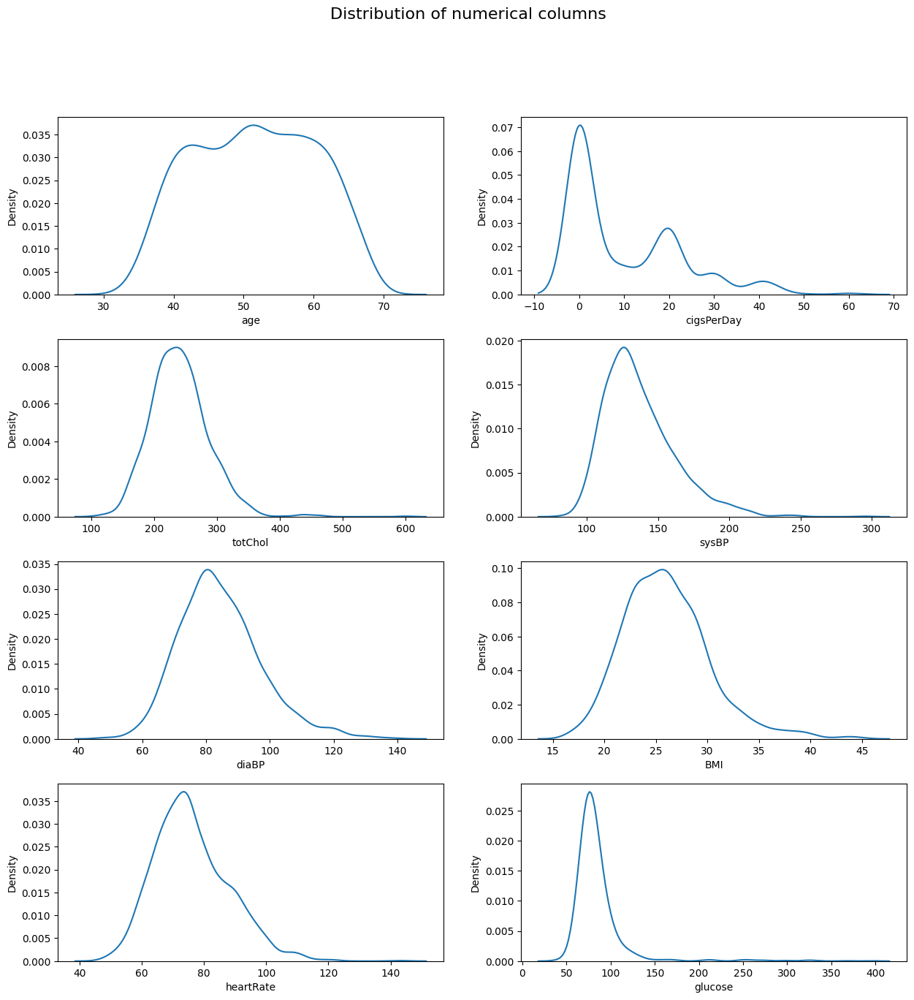

In [422]:
fig, axes = plt.subplots(4, 2, figsize=(15, 15), )
# add title to the figure
plt.subplots_adjust(hspace = 0.25)

fig.suptitle('Distribution of numerical columns', fontsize=16) 
for i, column in enumerate(numerical_columns):
    #plot distribution
    sns.kdeplot(df_train[column], ax=axes[i//2, i%2])

plt.show()

Observation

The histograms and probability distributions reveal that the values in the columns `totChol`, `sysBP`, `diaBP`, `BMI`, `heartRate`, and `glucose` follow an approximately normal distribution. Therefore, we can confidently impute the missing (NaN) values in these columns using the **mean**, as there are no significant outliers to skew the data.

For the remaining columns, which do not follow a normal distribution, we will use the **median** to replace NaN values. This approach helps mitigate the impact of potential outliers that could distort the data if the mean were used.

For categorical columns, the NaN values can be safely replaced with the **mode** of the data.


#### Dealing with NAN Values in the dataset

Replacing the NaN values in the columns using the **mean**, **median**, and **mode**, as determined by the distribution analysis discussed earlier. Only the metrics from training dataset should be used to impute NAN values in validation and test datasets.


In [423]:
# replace the nan values with mean/median/mode of TRAINING DATA
for i in df.columns:
    if i in categorical_columns:
        df_val.loc[:,i]=df_val[i].fillna(df_train[i].mode()[0])
        df_test.loc[:,i]=df_test[i].fillna(df_train[i].mode()[0])
        df_train.loc[:,i] = df_train[i].fillna(df_train[i].mode()[0])
    elif i in ["cigsPerDay", "totChol", "BMI", "heartRate", "glucose", "sysBP", "diaBP"]:
        df_val.loc[:,i] = df_val[i].fillna(df_train[i].mean())
        df_test.loc[:,i] = df_test[i].fillna(df_train[i].mean())
        df_train.loc[:,i] = df_train[i].fillna(df_train[i].mean())
    else:
        df_val.loc[:,i] = df_val[i].fillna(df_train[i].mean())
        df_test.loc[:,i] = df_test[i].fillna(df_train[i].mean())
        df_train.loc[:,i] = df_train[i].fillna(df_train[i].median())

Ensuring that the training dataset is free of any NaN values.

In [424]:
print("=== Training NAN values ===")
print("Column Name: Number of NAN values")
for i in df_train.columns:
    print(i,":",np.sum(df_train[i].isna()))

=== Training NAN values ===
Column Name: Number of NAN values
male : 0
age : 0
education : 0
currentSmoker : 0
cigsPerDay : 0
BPMeds : 0
prevalentStroke : 0
prevalentHyp : 0
diabetes : 0
totChol : 0
sysBP : 0
diaBP : 0
BMI : 0
heartRate : 0
glucose : 0
HeartDisease : 0


Checking the same for Validation dataset.

In [425]:
print("=== Validation NAN values ===")
print("Column Name: Number of NAN values")
for i in df_val.columns:
    print(i," ",np.sum(df_val[i].isna()))

=== Validation NAN values ===
Column Name: Number of NAN values
male   0
age   0
education   0
currentSmoker   0
cigsPerDay   0
BPMeds   0
prevalentStroke   0
prevalentHyp   0
diabetes   0
totChol   0
sysBP   0
diaBP   0
BMI   0
heartRate   0
glucose   0
HeartDisease   0


Ensuring that the test set is free of NAN values.

In [426]:
print("=== Test NAN values ===")
print("Column Name: Number of NAN values")
for i in df_test.columns:
    print(i," ",np.sum(df_test[i].isna()))


=== Test NAN values ===
Column Name: Number of NAN values
male   0
age   0
education   0
currentSmoker   0
cigsPerDay   0
BPMeds   0
prevalentStroke   0
prevalentHyp   0
diabetes   0
totChol   0
sysBP   0
diaBP   0
BMI   0
heartRate   0
glucose   0
HeartDisease   0


**Gaining Insights into Relationships Between Columns Using the Correlation Matrix**

The correlation matrix helps to quantify the linear relationships between numerical columns in the dataset. A heatmap is used to visualize the matrix, with color intensity indicating the strength of the correlations.

**Observation:** It appears that none of the features show a strong correlation with the target variable, indicating that no single feature has a significant influence on the output.


                     male       age  education  currentSmoker  cigsPerDay  \
male             1.000000 -0.000825   0.050628       0.259071    0.362584   
age             -0.000825  1.000000  -0.169492      -0.241407   -0.204105   
education        0.050628 -0.169492   1.000000       0.015612    0.038252   
currentSmoker    0.259071 -0.241407   0.015612       1.000000    0.766143   
cigsPerDay       0.362584 -0.204105   0.038252       0.766143    1.000000   
BPMeds          -0.037508  0.149913  -0.035867      -0.071738   -0.058893   
prevalentStroke  0.022038  0.090349  -0.054936      -0.023581   -0.038378   
prevalentHyp     0.021078  0.318335  -0.084708      -0.123996   -0.080293   
diabetes         0.019357  0.053672  -0.058483      -0.058252   -0.039971   
totChol         -0.066019  0.176904   0.016631      -0.055815   -0.051012   
sysBP           -0.020195  0.388856  -0.135599      -0.119543   -0.086594   
diaBP            0.080278  0.185070  -0.031204      -0.070943   -0.049594   

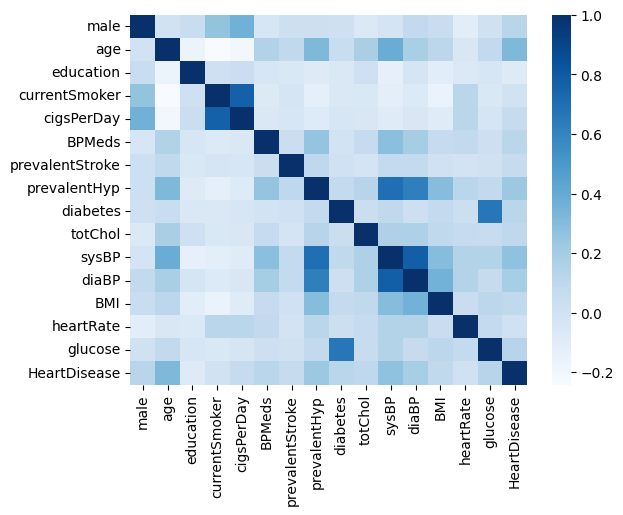

In [427]:
matrix=df_train.corr()
print(matrix)
sns.heatmap(matrix, cmap="Blues")
plt.show()

Prepare the training inputs and outputs

In [428]:
X_train=df_train.drop("HeartDisease",axis=1)
Y_train=df_train["HeartDisease"]

Preparing the features and outputs for validation set.

In [429]:
X_val=df_val.drop("HeartDisease",axis=1)
Y_val=df_val["HeartDisease"]

Preparing the features and outputs for the test set.

In [430]:
X_test=df_test.drop("HeartDisease",axis=1)
Y_test=df_test["HeartDisease"]

Converting the DataFrames to NumPy arrays for further computations and analyzing the class distribution within the training set.


In [431]:
X_train=np.array(X_train)
Y_train=np.array(Y_train)

# print(X_train)

print("Training data input shape:",X_train.shape)

# print(X_train)

print("Number of positive samples:",np.sum(Y_train==1))
print("Number of negative samples:",np.sum(Y_train==0))

Training data input shape: (1431, 15)
Number of positive samples: 732
Number of negative samples: 699


In [432]:
X_val=np.array(X_val)
Y_val=np.array(Y_val)

print("Validation data input shape:",X_val.shape)

# X_val=(X_val-mean)/std_dev

# print(np.sum(Y_val==1))
# print(np.sum(Y_val==0))

Validation data input shape: (306, 15)


In [433]:
X_test=np.array(X_test)
Y_test=np.array(Y_test)

print("Testing data input shape:",X_test.shape)

# X_test=(X_test-mean)/std_dev

# print(np.sum(Y_test==1))
# print(np.sum(Y_test==0))

Testing data input shape: (307, 15)


### Implementing the Logistic Regression Class

In [434]:
class LogisticRegression:
    def __init__(self,eta=1e-4,iterations=100, gradient_descent="Batch", regularization=None, lambda_val=0, batch_size=32, earlyStopping=False, max_iters=100):
        
        """
        Constructor for Logistic Regression model
        args:
            eta: float learning rate
            iterations: integer number of iterations
            gradient_descent: string type of gradient descent (Batch, Stochastic, MiniBatch) (default=Batch)
            regularization: type of regularization (None, L1, L2) (default=None)
            lambda_val: regularization parameter (default=0)
            batch_size: batch size for MiniBatch gradient descent (default=32)
            earlyStopping: whether to use early stopping or not (default=False)
            max_iters: maximum number of iterations for early stopping (default=100)
        
        returns:
            A Logistic Regression model object
        """
        
        self.eta=eta
        self.iterations=iterations

        if(gradient_descent not in ["Batch","Stochastic","MiniBatch"]):
            raise ValueError("Gradient descent should be one of Batch, Stochastic or MiniBatch")
        else:
            self.gradient_descent=gradient_descent

        if(gradient_descent=="MiniBatch"):
            if(batch_size<=0):
                raise ValueError("Batch size should be greater than 0")
            else:
                self.batch_size=batch_size
        else:
            self.batch_size=None
        
        if(regularization not in [None,"L1","L2"]):
            raise ValueError("Regularization should be one of None, L1 or L2")
        else:
            self.regularization=regularization

        if(regularization is None):
            self.lambda_val=0
        elif(lambda_val<0):
            raise ValueError("Lambda value should be greater than or equal to 0")
        else:
            self.lambda_val=lambda_val
        
        self.earlyStopping=earlyStopping

        if(self.earlyStopping):
            self.max_iters=max_iters
        else:
            self.max_iters=0


        self.weights=None 
        self.accuracies=None
        self.losses=None 
        self.all_weights=None
        self.validation_losses=None
        self.validation_accuracies=None
        
    def __str__(self):
        """ 
        Function to return the string representation of the model
        args:
            None
        returns:
            String representation of the model
        """

        return (f"Model: Logistic Regression, Learning rate (eta): {self.eta}, Iterations: {self.iterations}, Gradient Descent: {self.gradient_descent}, Regularization: {self.regularization}, Lambda: {self.lambda_val}, Batch Size: {self.batch_size}")

    def add_ones_column(self,X):
        """
        Function to add a column of ones to the input matrix
        args:
            X: input matrix
        returns:
            X_copy: numpy array with a column of ones added to the input matrix
        """



        X_copy=np.copy(X)
        ones_column=np.ones((X_copy.shape[0],1))
        X_copy=np.hstack((ones_column,X_copy))
        return X_copy

    def sigmoid(self,z):

        """  
        Function to calculate the sigmoid of the input
        sigmoid(z)=1/1+e^(-x)
        args:
            z: float or numpy array
        returns:
            integer or numpy array of sigmoid values of the input
        """
        # to avoid overflow, clip the values of input z
        z=np.clip(z,-500,500)
        return np.float64(1)/np.float64(1+np.exp(-z))
    
    def initialise_weights_and_losses(self,X):
        """    
        Function to initialize the model weights and losses based on the provided input matrix
        args:
            X: numpy array input matrix
        returns:
            None
        
        """

        #initialize weights according to a normal distribution with mean 0 and standard deviation 1
        self.weights=np.random.randn(X.shape[1])
        # initialize losses
        self.losses=[]
        #initialise all_weights
        self.all_weights=[]
        #initialize accutacies
        self.accuracies=[]
        self.all_weights.append(self.weights)
    
    def predict_probability(self,X):
        """     
        Function to predict the probailities of the input belonging to class 1 using sigmoid function
        args:
            X: numpy array of input matrix
        returns:
            predicted probabilities: numpy array of predicted probabilities of the input belonging to class 1
        
        """
        
        predicted_probabilities=self.sigmoid(X@self.weights)
        return predicted_probabilities
    
    def make_predictions(self,probabilities,threshold=0.5):

        """
        Function to make predictions based on the predicted probabilities
        args:
            probabilities: numpy array of predicted probabilities
            threshold: threshold value for classification
        returns:
            numpy array of predictions based on the threshold value
        """

        return np.where(probabilities >= threshold, 1, 0)
    
    def loss(self,X,Y):

        """
        Function to calculate the loss of the model based on the gradient descent and regularization
        It calculates the loss based on the cross entropy loss and the regularization term
        Cross entropy loss = mean( -Y*log(X_probabilities)-(1-Y)*log(1-X_probabilities) )
        args:
            X: numpy array of input matrix
            Y: numpy array of target values
        returns:
            loss: float value of the loss
        """

        X_probabilities=self.predict_probability(X)
        if(self.regularization is None):
            loss=0
            for i in range(len(Y)):
                loss+=-Y[i]*np.log(X_probabilities[i]+1e-10)-(1-Y[i])*np.log(1-X_probabilities[i]+1e-10)
            # print(loss)
            return loss/len(Y)
        elif(self.regularization=="L1"):

            """          
            L1 regularization term is the sum of the absolute values of the weights 
            """
            return np.mean(-Y*np.log(X_probabilities+1e-10)-(1-Y)*np.log(1-X_probabilities+1e-10)+self.lambda_val*np.sum(np.abs(self.weights)))

        elif(self.regularization=="L2"):
            """     
            L2 regularization term is the sum of the squares of the weights
            """
            return np.mean(-Y*np.log(X_probabilities+1e-10)-(1-Y)*np.log(1-X_probabilities+1e-10)+self.lambda_val*np.sum(self.weights**2))

    def update_weights(self,X,Y):
        """
        Function to update the weights based on the type of gradient descent
        It calls the respective function based on the type of gradient descent
        args:
            X: numpy array of input matrix
            Y: numpy array of target values
        returns:
            None
        """

        if(self.gradient_descent=="Batch"):
            self.update_weights_batch(X,Y)
        elif(self.gradient_descent=="Stochastic"):
            self.update_weights_stochastic(X,Y)
        elif(self.gradient_descent=="MiniBatch"):
            self.update_weights_mini_batch(X,Y)

    def update_weights_batch(self,X,Y):
        """
        Function to update the weights based on the batch gradient descent
        It takes into account the entire input matrix and updates the weights based on the input matrix
        args:
            X: numpy array of input matrix
            Y: numpy array of target values
        returns:
            None
        """

        #make the copy of the weights to use the original ones while predicting the probabilities
        copyweights=np.copy(self.weights)

        #iterate over the weights and update them based on the regularization
        for i in range(len(self.weights)):
            sum=0
            for j in range(len(X)):
                sum+=(self.predict_probability(X[j])-Y[j])*X[j][i]
            
            if(self.regularization is None):
                copyweights[i]=copyweights[i]-self.eta*sum
            elif(self.regularization=="L1"):
                copyweights[i]=copyweights[i]-self.eta*(sum+self.lambda_val*np.sign(self.weights[i]))
            elif(self.regularization=="L2"):
                copyweights[i]=copyweights[i]-self.eta*(sum+self.lambda_val*2*self.weights[i])
        self.weights=copyweights
        
    def update_weights_stochastic(self,X,Y):
        """
        Function to update the weights based on the stochastic gradient descent and regularization
        It takes a random sample from the input matrix and updates the weights based on the sample
        args:
            X: numpy array of input matrix
            Y: numpy array of target values
        returns:
            None
        """
        X_copy=np.copy(X)
        Y_copy=np.copy(Y)

        index=np.random.randint(0,len(X_copy))
        X_sample=X_copy[index]
        Y_sample=Y_copy[index]

        copyweights=np.copy(self.weights)
        for i in range(len(self.weights)):
            if(self.regularization is None):
                copyweights[i]=copyweights[i]-self.eta*(self.predict_probability(X_sample)-Y_sample)*X_sample[i]
            elif(self.regularization=="L1"):
                copyweights[i]=copyweights[i]-self.eta*((self.predict_probability(X_sample)-Y_sample)*X_sample[i]+self.lambda_val*np.sign(self.weights[i]))
            elif(self.regularization=="L2"):
                copyweights[i]=copyweights[i]-self.eta*((self.predict_probability(X_sample)-Y_sample)*X_sample[i]+self.lambda_val*2*self.weights[i])
        self.weights=copyweights

    def update_weights_mini_batch(self,X,Y):
        """
        Function to update the weights based on the MiniBatch gradient descent and regularization
        It takes a random sample of batch size from the input matrix and updates the weights based on the sample
        args:
            X: numpy array of input matrix
            Y: numpy array of target values
        returns:
            None
        """
        X_copy=np.copy(X)
        Y_copy=np.copy(Y)

        indices=np.random.choice(len(X_copy),self.batch_size,replace=False)
        X_sample=X_copy[indices]
        Y_sample=Y_copy[indices]

        copyweights=np.copy(self.weights)
        for i in range(len(self.weights)):
            sum=0
            for j in range(len(X_sample)):
                sum+=(self.predict_probability(X_sample[j])-Y_sample[j])*X_sample[j][i]

            if(self.regularization is None):
                copyweights[i]=copyweights[i]-self.eta*sum
            elif(self.regularization=="L1"):
                copyweights[i]=copyweights[i]-self.eta*(sum+self.lambda_val*np.sign(self.weights[i]))
            elif(self.regularization=="L2"):
                copyweights[i]=copyweights[i]-self.eta*(sum+self.lambda_val*2*self.weights[i])
        self.weights=copyweights

    def calculate_accuracy(self,X,Y):
        """
        Function to calculate the accuracy of the model based on the input matrix and target values
        It calls the make_predictions function to make predictions based on the probabilities and then takes the mean of the predictions
        args:
            X: numpy array of input matrix
            Y: numpy array of target values
        returns:
            accuracy: float value of the accuracy
        """
        return (np.mean(self.make_predictions(self.predict_probability(X))==Y))

    def fit(self, X_train, Y_train, X_val=None, Y_val=None):
        """
        Function to fit the model based on the input matrix and target values
        It initializes the weights and losses, and then iterates over the number of iterations to update the weights
        It also calculates the accuracy and loss at each iteration and stores them in the respective lists
        args:
            X_train: numpy array of input matrix for training
            Y_train: numpy array of target values for training
            X_val: numpy array of input matrix for validation (default=None)
            Y_val: numpy array of target values for validation (default=None)
        returns:
            None
        """
        # print(X_train.shape)
        # print(Y_train.shape)

        # copy the input matrices   
        Y=np.copy(Y_train)
        X=np.copy(X_train)

        # add a column of ones to the input matrix to account for the bias term
        ones_column = np.ones((X.shape[0], 1))
        X = np.hstack((ones_column, X))

        # copy the validation input matrices
        if(X_val is not None and Y_val is not None):
            Y_val=np.copy(Y_val)
            X_val=np.copy(X_val)
            ones_column = np.ones((X_val.shape[0], 1))
            X_val = np.hstack((ones_column, X_val))
        #initialize the weights and losses
        self.initialise_weights_and_losses(X)
        

        if(X_val is not None and Y_val is not None):
            self.validation_losses=[]
            self.validation_accuracies=[] 

        # print(self.make_predictions(self.predict_probability(X)))
        
        #check only at first iteration
        self.losses.append(self.loss(X,Y))
        # print(f"Iteration: {0}, Training Loss: {self.losses[-1]}, Training Accuracy: {self.calculate_accuracy(X,Y)}")

        iters=0
        best_loss=float("inf")
        best_weights=[]
        for i in range(self.iterations):
            self.losses.append(self.loss(X,Y))
            print(f"Iteration: {i}, Training Loss: {self.losses[-1]}, Training Accuracy: {self.calculate_accuracy(X,Y)}")
            self.accuracies.append(self.calculate_accuracy(X,Y))
            if(X_val is not None and Y_val is not None):
                # print("Calculating validation loss and accuracy")
                val_loss=self.loss(X_val,Y_val)

                """
                  early stopping: if the validation loss is increasing for more than max_iters, stop the training
                """
                if(self.earlyStopping==True):
                    if(val_loss<best_loss):
                        best_loss=val_loss
                        best_weights=self.weights
                        iters=0
                    else:
                        iters+=1
                    if(iters>self.max_iters):
                        print("Early stopping at iteration:",i)
                        self.weights=best_weights
                        break
                self.validation_losses.append(val_loss)
                self.validation_accuracies.append(self.calculate_accuracy(X_val,Y_val))
                
            self.update_weights(X,Y)
            self.all_weights.append(self.weights)
     
            
        # print the final weights and loss
        print("Final weights:",self.weights)
        print("Final loss:",self.losses[-1])
        if(X_val is not None and Y_val is not None):
            print("Validation accuracy:",(self.validation_accuracies))
            print("Validation loss:",self.validation_losses)
        
    def evaluate(self,X,Y):
        """
        Function to evaluate the model based on the input matrix and target values and just print the accuracy and loss, mostly used for testing
        args:
            X: numpy array of input matrix
            Y: numpy array of target values
        returns:
            None
        """
        X=np.copy(X)
        Y=np.copy(Y)
        ones_column = np.ones((X.shape[0], 1))
        X = np.hstack((ones_column, X))
        print("Accuracy:",self.calculate_accuracy(X,Y))
        print("Loss:",self.loss(X,Y))
    
    def confusion_matrix(self,X,Y):
        """
        Function to calculate the confusion matrix based on the input matrix and target values
        Used mostly for validation and testing sets.
        args:
            X: numpy array of input matrix
            Y: numpy array of target values
        returns:
            confusion_matrix: numpy array of confusion matrix
        """
        X=np.copy(X)
        Y=np.copy(Y)
        ones_column = np.ones((X.shape[0], 1))
        X = np.hstack((ones_column, X))
        predicted_probabilities=self.predict_probability(X)
        predictions=self.make_predictions(predicted_probabilities)
        confusion_matrix=np.zeros((2,2))
        # print(len(Y))
        for i in range(len(Y)):
            # print(Y[i],predictions[i])
            confusion_matrix[int(Y[i])][int(predictions[i])]+=1
       
        return confusion_matrix
    
    def confusion_matrix_from_probabilities(self,y_true,y_predictions,threshold=0.5):
        """
        Function to calculate the confusion matrix based on the predicted probabilities and target values
        Used mostly for validation and testing sets.
        args:
            y_true: numpy array of target values
            y_predictions: numpy array of predicted probabilities
            threshold: threshold value for classification
        returns:
            confusion_matrix: numpy array of confusion matrix
        """
        y_pred = np.where(y_predictions >= threshold, 1, 0)
        confusion_matrix = np.zeros((2,2))
        for i in range(len(y_true)):
            confusion_matrix[y_true[i]][y_pred[i]]+=1
        return confusion_matrix

    def plot_confusion_matrix(self,confusion_matrix, title=None):
        """
        Function to plot the confusion matrix
        args:
            confusion_matrix: numpy array of confusion matrix
            title: string title of the plot (default=None)
        outputs:
            the confusion matrix plot
        returns:
            None
        """
        sns.heatmap(confusion_matrix,annot=True,cmap="Blues")
        if(title is not None):
            plt.title(title)
        else:
            plt.title("Confusion Matrix")
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.show()

    def precision(self,confusion_matrix):
        """
        Function to calculate the precision based on the confusion matrix.
        Precision is the ratio of true positives to the sum of true positives and false positives
        args:
            confusion_matrix: numpy array of confusion matrix
        returns:
            precision: float value of the precision
        """
        if(confusion_matrix[1][1]+confusion_matrix[0][1]==0):
            return 0
        return confusion_matrix[1][1]/(confusion_matrix[1][1]+confusion_matrix[0][1])
    
    def recall(self,confusion_matrix):
        """    
        Function to calculate the recall based on the confusion matrix.
        Recall is the ratio of true positives to the sum of true positives and false negatives
        args:
            confusion_matrix: numpy array of confusion matrix
        returns:
            recall: float value of the recall
        """
        if(confusion_matrix[1][1]+confusion_matrix[1][0]==0):
            return 0
        return confusion_matrix[1][1]/(confusion_matrix[1][1]+confusion_matrix[1][0])
    
    def f1_score(self,confusion_matrix):
        """
        Function to calculate the f1 score based on the confusion matrix.
        F1 score is the harmonic mean of precision and recall
        args:
            confusion_matrix: numpy array of confusion matrix
        returns:
            f1_score: float value of the f1 score
        """
        if(self.precision(confusion_matrix)+self.recall(confusion_matrix)==0):
            return 0
        return 2*self.precision(confusion_matrix)*self.recall(confusion_matrix)/(self.precision(confusion_matrix)+self.recall(confusion_matrix))

    def tpr_fpr(self, y_true, y_probabilities,threshold):
        """       
        Function to calculate the true positive rate and false positive rate based on the target values, predicted probabilities and threshold
        args:
            y_true: numpy array of target values
            y_probabilities: numpy array of predicted probabilities
            threshold: threshold value for classification
        returns:
            tpr: float value of the true positive rate
            fpr: float value of the false positive rate
        """
        y_pred = np.where(y_probabilities >= threshold, 1, 0)
        confusion_matrix = self.confusion_matrix_from_probabilities(y_true, y_pred, threshold)
        tpr = confusion_matrix[1][1] / (confusion_matrix[1][1] + confusion_matrix[1][0])
        fpr = confusion_matrix[0][1] / (confusion_matrix[0][1] + confusion_matrix[0][0])
        return tpr, fpr

    def caclulate_roc(self, y_true, y_predictions):
        """
        Function to calculate the true positive rate and false positive rate based on the target values and predicted probabilities
        It sorts the predicted probabilities and then calculates the true positive rate and false positive rate for each threshold
        args:
            y_true: numpy array of target values
            y_predictions: numpy array of predicted probabilities
        returns:
            tprs: numpy array of true positive rates
            fprs: numpy array of false positive rates
        """
        thresholds=np.sort(np.copy(y_predictions))
        tprs=[]
        fprs=[]
        for i in thresholds:
            tpr,fpr=self.tpr_fpr(y_true,y_predictions,i)
            tprs.append(tpr)
            fprs.append(fpr)
        tprs=np.array(tprs)
        fprs=np.array(fprs)
        return tprs,fprs
    
    def plot_roc(self, tprs, fprs):
        """
        Function to plot the ROC curve based on the true positive rates and false positive rates
        args:
            tprs: numpy array of true positive rates
            fprs: numpy array of false positive rates
        outputs:
            the ROC curve plot
        returns:
            None
        """
        plt.plot(fprs, tprs)
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve")
        plt.plot([0,1],[0,1], linestyle="--")   
        plt.show()

    def auc_score(self,tprs,fprs):
        """
        Function to calculate the Area Under the Curve based on the true positive rates and false positive rates: AUC Score
        It sorts the false positive rates and then calculates the area under the curve using the trapezoidal rule
        args:
            tprs: numpy array of true positive rates
            fprs: numpy array of false positive rates
        returns:
            auc: float value of the Area Under the Curve   
        """
        idx=np.argsort(fprs)
        fprs=fprs[idx]
        tprs=tprs[idx]
        return np.trapz(tprs,fprs)

    def plot_metrics(self, title=None):
        """
        Function to plot the model loss and model accuracy in the same figure
        args:
            title: string title of the plot
        outputs:
            the model loss and model accuracy plot in the same figure
        returns:
            None
        """
    #plot model loss and model accuracy in same figure
        fig, axes = plt.subplots(1, 2, figsize=(12, 4) )
        # add title to the figure
        plt.subplots_adjust(hspace = 0.50)
        plt.subplots_adjust(wspace = 0.50)
        if(title is not None):
            fig.suptitle(title, fontsize=16)
        else:
            fig.suptitle('Model Loss and Model Accuracy', fontsize=16)

        axes[0].plot(self.losses)
        if(self.validation_losses is not None):
            axes[0].plot(self.validation_losses)
        axes[0].set_title("Model Loss")
        axes[0].set_xlabel("Iterations")
        axes[0].set_ylabel("Loss")
        if(self.validation_losses is not None):
            axes[0].legend(["Training Loss","Validation Loss"])
        else:
            axes[0].legend(["Training Loss"])


        axes[1].plot(self.accuracies)
        if(self.validation_accuracies is not None):
            axes[1].plot(self.validation_accuracies)
        axes[1].set_title("Model Accuracy")
        axes[1].set_xlabel("Iterations")
        axes[1].set_ylabel("Accuracy")
        if(self.validation_accuracies is not None):
            axes[1].legend(["Training Accuracy","Validation Accuracy"])
        else:
            axes[1].legend(["Training Accuracy"])

        plt.show()


#### (a) Implement Logistic Regression using Batch Gradient Descent. 

Plot training loss vs. iteration, validation loss vs. iteration, training accuracy vs. iteration,
and validation accuracy vs. iteration.

In [435]:
"""  
Model 1: Logistic Regression with Batch Gradient Descent, No Regularization, No Early Stopping
Data: No Normalization
Model applied on data after downsampling the majority class and adding noise to the minority class
No normalization of features is done. Different features have different scales and ranges.
"""

model1=LogisticRegression(eta=1e-3, iterations=100)
model1.fit(X_train,Y_train,X_val,Y_val)

Iteration: 0, Training Loss: 11.247428231974135, Training Accuracy: 0.5115303983228512
Iteration: 1, Training Loss: 11.778422697866102, Training Accuracy: 0.48846960167714887
Iteration: 2, Training Loss: 11.247428231974135, Training Accuracy: 0.5115303983228512
Iteration: 3, Training Loss: 11.778422697866102, Training Accuracy: 0.48846960167714887
Iteration: 4, Training Loss: 11.247428231974135, Training Accuracy: 0.5115303983228512
Iteration: 5, Training Loss: 11.778422697866102, Training Accuracy: 0.48846960167714887
Iteration: 6, Training Loss: 11.247428231974135, Training Accuracy: 0.5115303983228512
Iteration: 7, Training Loss: 11.778422697866102, Training Accuracy: 0.48846960167714887
Iteration: 8, Training Loss: 11.247428231974135, Training Accuracy: 0.5115303983228512
Iteration: 9, Training Loss: 11.778422697866102, Training Accuracy: 0.48846960167714887
Iteration: 10, Training Loss: 11.247428231974135, Training Accuracy: 0.5115303983228512
Iteration: 11, Training Loss: 11.7784

**Observation:**
Due to the lack of feature normalization, the model's weights exhibit varied ranges across different features. This may cause features with larger magnitudes to dominate the learning process, potentially leading to suboptimal convergence or performance. Normalizing the input features (e.g., scaling them to a standard range or zero mean and unit variance) can help mitigate this issue by ensuring that all features contribute more evenly to the gradient updates during training.


In [436]:
print("Model Final Weights\n",model1.weights)

Model Final Weights
 [-1.45961780e+00  3.62035587e+00  1.11177305e+02 -7.33353389e+00
 -5.29945955e-02  4.69149264e+01  1.48197870e+00 -9.37593687e-01
  5.89497996e+00  1.28808468e+00  9.70076677e+01  2.08830401e+02
  3.55063694e+01 -1.04807643e+01 -8.46662563e+01  8.93561435e+01]


**Observation:**
Due to the presence of features with larger magnitudes dominating the training process, the loss exhibits significant fluctuations during the optimization. The model does not converge and oscillates, without stabilizing at a value.


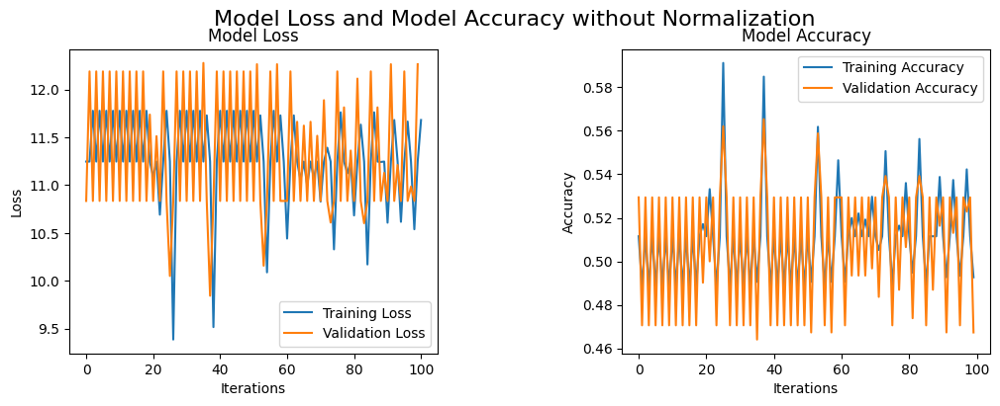

In [437]:
#plot model loss and model accuracy in same figure
model1.plot_metrics("Model Loss and Model Accuracy without Normalization") 

=== Confusion Matrix for Model on Validation Set ===


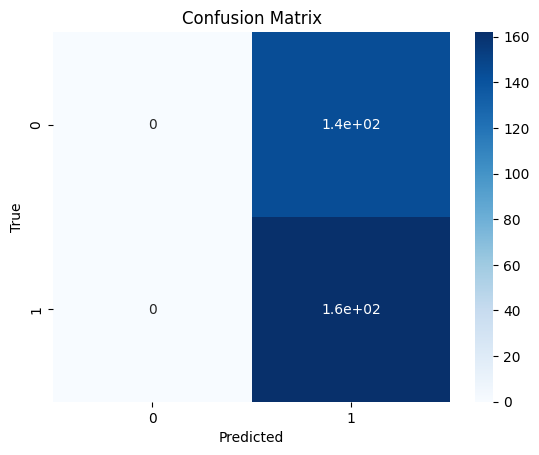

In [438]:
"""    
Plotting the confusion matrix for the model on validation set
"""

print("=== Confusion Matrix for Model on Validation Set ===")
cm_val_model=model1.confusion_matrix(X_val,Y_val)
model1.plot_confusion_matrix(cm_val_model)

In [439]:
"""     
Evaluation of the model on the test set
"""

print("=== Model Evaluation on Test Data ===")
model1.evaluate(X_test,Y_test)

=== Model Evaluation on Test Data ===
Accuracy: 0.48859934853420195
Loss: 11.775435166077044


=== Confusion Matrix for model on Testing Data ===


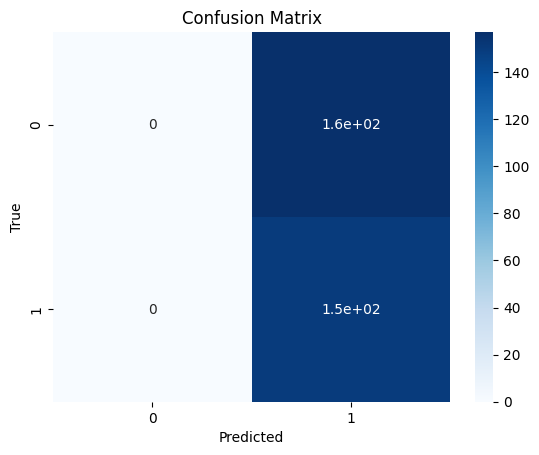

In [440]:
print("=== Confusion Matrix for model on Testing Data ===")
cm=model1.confusion_matrix(X_test,Y_test)
model1.plot_confusion_matrix(cm)

In [441]:
print("=== Evaluation Metrics on Testing Data ===")
print("Accuacy:",(cm[0][0]+cm[1][1])/np.sum(cm))
print("Precision:",model1.precision(cm))
print("Recall:",model1.recall(cm))
print("F1 Score:",model1.f1_score(cm))

=== Evaluation Metrics on Testing Data ===
Accuacy: 0.48859934853420195
Precision: 0.48859934853420195
Recall: 1.0
F1 Score: 0.6564551422319475


**Normalizing the data**

To normalize the data and ensure feature consistency, we use the following formula:

$$
\frac{X - \mu_X}{\sigma_X}
$$

In this formula:
- $X$ represents the data value.
- $\mu_X$ is the mean of the feature $X$.
- $\sigma_X$ is the standard deviation of the feature $X$.

This process scales the data to have a mean of 0 and a standard deviation of 1, making it easier to compare and analyze different features on the same scale.


In [442]:
"""     
Nomrmalizing the data to put everything on the same scale
"""

mean=np.mean(X_train,axis=0)
std_dev=np.std(X_train,axis=0)

"""
X_train_normalized contains the normalized training data
X_val_normalized contains the normalized validation data
X_test_normalized contains the normalized testing data
"""

X_train_normalized=(X_train-mean)/std_dev
X_val_normalized=(X_val-mean)/std_dev
X_test_normalized=(X_test-mean)/std_dev

Implementing Logistic Regression on this **Normalized data**

In [443]:
"""    
Model 2: Logistic Regression with Batch Gradient Descent, No Regularization, No Early Stopping
Data: Normalized
The data is normalized to put everything on the same scale and then the model is applied
"""

model2=LogisticRegression(eta=1e-3,iterations=125)
print(model2)
model2.fit(X_train_normalized,Y_train,X_val_normalized,Y_val)

Model: Logistic Regression, Learning rate (eta): 0.001, Iterations: 125, Gradient Descent: Batch, Regularization: None, Lambda: 0, Batch Size: None
Iteration: 0, Training Loss: 1.4038640006829473, Training Accuracy: 0.519916142557652
Iteration: 1, Training Loss: 1.15156795540499, Training Accuracy: 0.5660377358490566
Iteration: 2, Training Loss: 0.9995718300606741, Training Accuracy: 0.5849056603773585
Iteration: 3, Training Loss: 0.8966670248367593, Training Accuracy: 0.6009783368273934
Iteration: 4, Training Loss: 0.82070659694188, Training Accuracy: 0.6058700209643606
Iteration: 5, Training Loss: 0.7628665134893665, Training Accuracy: 0.6163522012578616
Iteration: 6, Training Loss: 0.7188209140235541, Training Accuracy: 0.6247379454926625
Iteration: 7, Training Loss: 0.685824829428677, Training Accuracy: 0.6345213137665968
Iteration: 8, Training Loss: 0.6616823071023377, Training Accuracy: 0.6401118099231307
Iteration: 9, Training Loss: 0.6444332726023939, Training Accuracy: 0.64150

**Observation:** The model weights are now consistent because all features are scaled to the same range. This ensures that each feature contributes equally to the model, leading to more balanced and reliable weight values.


In [444]:
print("Model2 Final Weights\n",model2.weights)

Model2 Final Weights
 [ 0.07158961  0.19504816  0.56936921 -0.05752517 -0.08621673  0.34154099
  0.11024344  0.09625478  0.08381945  0.14321756  0.07157335  0.30589535
  0.01265376 -0.00068941 -0.03456936  0.19271631]


**Observation:** After feature normalization, we observe that the validation and training losses start to converge after a certain number of iterations, with accuracy showing an increasing trend. As expected, the validation loss is lower than the training loss.


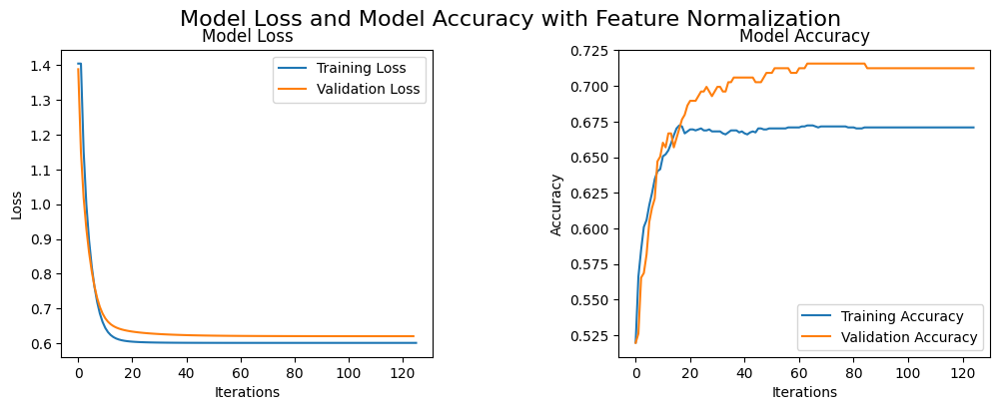

In [445]:
#plotting the accuracy and loss graphs
model2.plot_metrics("Model Loss and Model Accuracy with Feature Normalization")

In [446]:
print("=== Evaluation of Model on Testing Data ===")
model2.evaluate(X_test_normalized,Y_test)

=== Evaluation of Model on Testing Data ===
Accuracy: 0.6710097719869706
Loss: 0.6050536229612443


=== Confusion Matrix For Validation Data ===
Accuracy: 0.7124183006535948
Precision: 0.7341772151898734
Recall: 0.7160493827160493
F1 Score: 0.7250000000000001


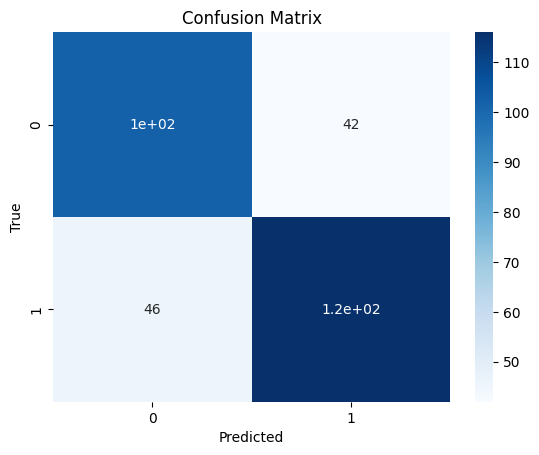

In [447]:
print("=== Confusion Matrix For Validation Data ===")
cm_val_model2=model2.confusion_matrix(X_val_normalized,Y_val)
# print(cm_val_model2)
print("Accuracy:",(cm_val_model2[0][0]+cm_val_model2[1][1])/np.sum(cm_val_model2))
print("Precision:",model2.precision(cm_val_model2))
print("Recall:",model2.recall(cm_val_model2))
print("F1 Score:",model2.f1_score(cm_val_model2))
model1.plot_confusion_matrix(cm_val_model2)

=== ROC-AUC Score on Validation Data ===
AUC Score: 0.731031378600823


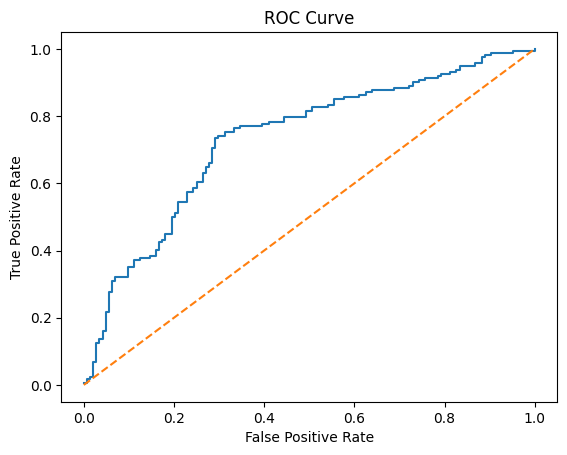

In [448]:
print("=== ROC-AUC Score on Validation Data ===")
X_val_normalized_ones=model2.add_ones_column(X_val_normalized)
y_predictions=model2.predict_probability(X_val_normalized_ones)
tprs,fprs=model2.caclulate_roc(Y_val,y_predictions)
print("AUC Score:",model2.auc_score(tprs,(fprs)))
model1.plot_roc(tprs,fprs)


=== Confusion Matrix For Testing Data ===
Accuracy: 0.6710097719869706
Precision: 0.6666666666666666
Recall: 0.6533333333333333
F1 Score: 0.6599326599326599


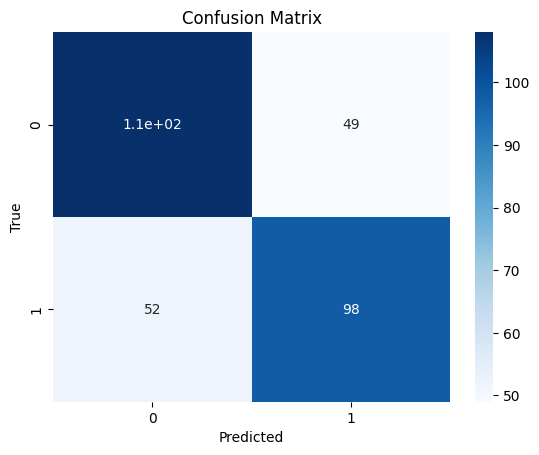

In [449]:
print("=== Confusion Matrix For Testing Data ===")
cm_test_model2=model2.confusion_matrix(X_test_normalized,Y_test)
# print(cm_test_model2)
print("Accuracy:",(cm_test_model2[0][0]+cm_test_model2[1][1])/np.sum(cm_test_model2))
print("Precision:",model2.precision(cm_test_model2))
print("Recall:",model2.recall(cm_test_model2))
print("F1 Score:",model2.f1_score(cm_test_model2))
model2.plot_confusion_matrix(cm_test_model2)

=== ROC-AUC Score on Testing Data ===
AUC Score: 0.7292781316348195


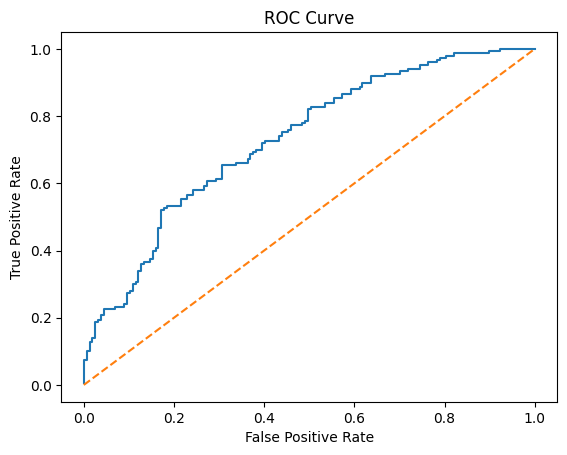

In [450]:
print("=== ROC-AUC Score on Testing Data ===")
X_test_normalized_ones=model2.add_ones_column(X_test_normalized)
y_predictions=model2.predict_probability(X_test_normalized_ones)
tprs_test_normalized_ones,fprs_test_normalized_ones=model2.caclulate_roc(Y_test,y_predictions)

print("AUC Score:",model1.auc_score(tprs_test_normalized_ones,fprs_test_normalized_ones))
model2.plot_roc(tprs_test_normalized_ones,fprs_test_normalized_ones)


(b) **Investigate and compare the performance of the model with different feature scaling methods**

Min-max scaling and No scaling. Plot the loss vs. iteration
for each method and discuss the impact of feature scaling on model convergence

**Min-max scaling**

This concept involves bringing every feature to the same scale of 0 to 1. It is implemented using the following formula:

$$
\frac{X - \min_X}{\max_X - \min_X}
$$

In this formula:
- $X$ represents the data value.
- $\min_X$ is the minimum value of the feature $X$.
- $\max_X$ is the maximum value of the feature $X$.

0 corresponds to the minimum value and 1 corresponds to the maximum value of the feature. This standardization helps in maintaining uniformity among scales of the features.

In [451]:
"""    
Implementing the min-max scaling (another way of normalizaing the data) to put everything on the same scale

X_train_min_max contains the min-max scaled training data
X_val_min_max contains the min-max scaled validation data
X_test_min_max contains the min-max scaled testing data

"""

# min-max scaling
min=np.min(X_train,axis=0)
max=np.max(X_train,axis=0)

X_train_min_max=np.copy(X_train)
X_val_min_max=np.copy(X_val)
X_test_min_max=np.copy(X_test)
#only for numerical columns
for i in range(X_train.shape[1]):
    if i in indices_numerical:
        X_train_min_max[:,i]=(X_train[:,i]-min[i])/(max[i]-min[i])
        X_val_min_max[:,i]=(X_val[:,i]-min[i])/(max[i]-min[i])
        X_test_min_max[:,i]=(X_test[:,i]-min[i])/(max[i]-min[i])


# X_train_min_max=(X_train-min)/(max-min)
# X_val_min_max=(X_val-min)/(max-min)
# X_test_min_max=(X_test-min)/(max-min)

Implementing Logistic Regression on Min-Max scaled data.

In [452]:
"""   
Model 3: Logistic Regression with Batch Gradient Descent, No Regularization, No Early Stopping
Data: Min-Max Scaled
The data is min-max scaled to put everything on the same scale and then the model is applied
"""

model3=LogisticRegression(eta=1e-4,iterations=250)
model3.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 0.8785611950402771, Training Accuracy: 0.517120894479385
Iteration: 1, Training Loss: 0.8112137950480597, Training Accuracy: 0.5303983228511531
Iteration: 2, Training Loss: 0.763076895291884, Training Accuracy: 0.5366876310272537
Iteration: 3, Training Loss: 0.7302596995641136, Training Accuracy: 0.5534591194968553
Iteration: 4, Training Loss: 0.7087276109506799, Training Accuracy: 0.573025856044724
Iteration: 5, Training Loss: 0.694981266568878, Training Accuracy: 0.5793151642208246
Iteration: 6, Training Loss: 0.6863457328907788, Training Accuracy: 0.5849056603773585
Iteration: 7, Training Loss: 0.680949071803393, Training Accuracy: 0.5918937805730259
Iteration: 8, Training Loss: 0.6775572732190631, Training Accuracy: 0.5946890286512928
Iteration: 9, Training Loss: 0.6753881355119563, Training Accuracy: 0.593990216631726
Iteration: 10, Training Loss: 0.6739581463808284, Training Accuracy: 0.6002795248078266
Iteration: 11, Training Loss: 0.6729731218603494

In [453]:
print("Model3 Final Weights\n",model3.weights)

Model3 Final Weights
 [-0.07641529  0.35406563  0.53153049 -0.20915911 -0.06843245  0.26699386
  0.78303404 -0.3415945   0.81351526  0.74099969 -1.17033645  0.16963119
 -0.42118553 -0.01096271  0.34575979  0.75323228]


**Observation:** After some hyperparameter tuning, we observe that the min-max scaling of the data has led to model convergence. The accuracy shows an increasing trend.

This is much better, unlike the no-scaling one.


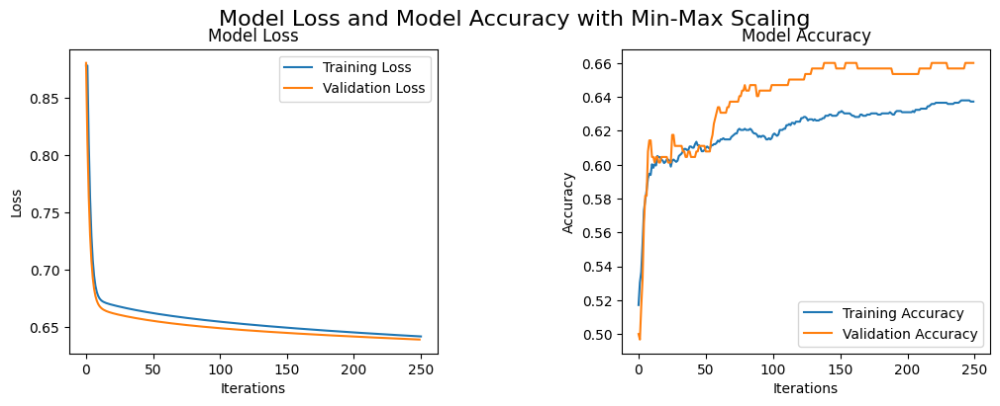

In [454]:
"""     
Plotting the accuracy and loss graphs
"""

model3.plot_metrics("Model Loss and Model Accuracy with Min-Max Scaling")

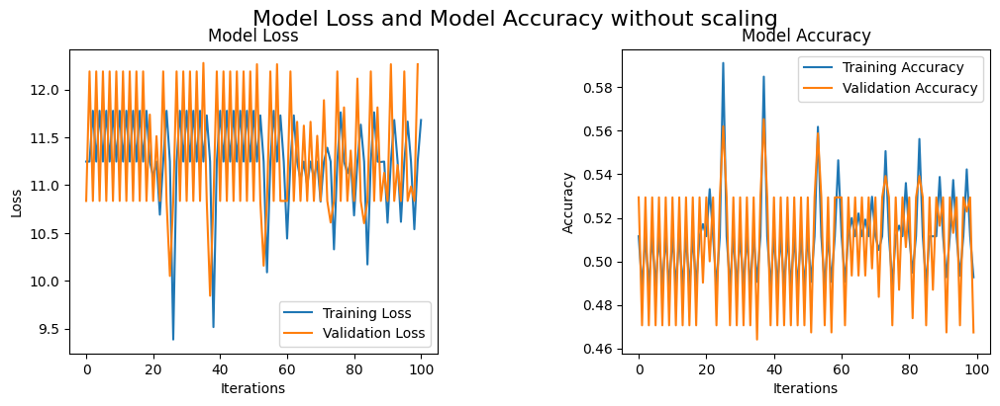

In [455]:
"""     
Comparing the curve with the one without scaling
"""

model1.plot_metrics("Model Loss and Model Accuracy without scaling")

In [456]:
print("=== Evaluation of Model trained on min-max scaled data on Testing Data ===")
model3.evaluate(X_test_min_max,Y_test)

=== Evaluation of Model trained on min-max scaled data on Testing Data ===
Accuracy: 0.6514657980456026
Loss: 0.6478443881351607


(c) **Model Evaluation Metrics**

To evaluate the performance of the model on the validation set, we can use the following metrics: precision, recall, F1 score, and ROC-AUC score. Each metric provides unique insights into the model’s performance.

1. **Confusion Matrix**
The confusion matrix is a table that helps visualize the performance of a classification model. It shows the number of:
- **True Positives (TP):** Correctly predicted positive case
- **True Negatives (TN):** Correctly predicted negative cases
- **False Positives (FP):** Incorrectly predicted positive cases
- **False Negatives (FN):** Incorrectly predicted negative cases 

\[
\begin{bmatrix}
\text{TN} & \text{FP} \\
\text{FN} & \text{TP}
\end{bmatrix}
\]

From this matrix, we can calculate important metrics like precision, recall, and F1 score.

2. **Precision**
Precision measures how many of the positive predictions made by the model are actually correct.

$$
\text{Precision} = \frac{TP}{TP + FP}
$$

A high precision indicates that the model is good at minimizing false positives.

3. **Recall (Sensitivity or True Positive Rate)**
Recall measures how many of the actual positive cases were correctly predicted by the model.

$$
\text{Recall} = \frac{TP}{TP + FN}
$$

A high recall indicates that the model successfully identifies most of the positive cases.

4. **F1 Score**
The F1 score is the harmonic mean of precision and recall. It provides a balanced measure of both, especially when we want to balance the precision and recall trade-off.

$$
\text{F1 Score} = 2 \times \frac{\text{Precision} \times \text{Recall}}{\text{Precision} + \text{Recall}}
$$

A high F1 score indicates that the model has a good balance between precision and recall.

5. **ROC-AUC Score**
The ROC-AUC (Receiver Operating Characteristic - Area Under the Curve) score is a performance metric for binary classifiers. The ROC curve plots the true positive rate (recall) against the false positive rate (FPR) at varying thresholds. The AUC (Area Under the Curve) measures the overall ability of the model to distinguish between positive and negative classes.

$$
\text{False Positive Rate (FPR)} = \frac{FP}{FP + TN}
$$

An AUC score of 1 indicates a perfect model, while a score of 0.5 indicates a model that performs no better than random guessing.The higher the AUC score, the better the model's ability to predict correctly.



=== Confusion Matrix For Validation Data ===
Accuracy: 0.6601307189542484
Precision: 0.6959459459459459
Recall: 0.6358024691358025
F1 Score: 0.6645161290322581


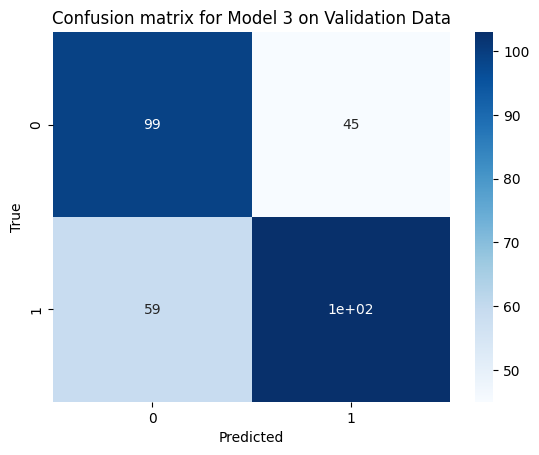

In [457]:
print("=== Confusion Matrix For Validation Data ===")
cm_val_model3=model3.confusion_matrix(X_val_min_max,Y_val)
# print(cm_val_model2)
print("Accuracy:",(cm_val_model3[0][0]+cm_val_model3[1][1])/np.sum(cm_val_model3))
print("Precision:",model3.precision(cm_val_model3))
print("Recall:",model3.recall(cm_val_model3))
print("F1 Score:",model3.f1_score(cm_val_model3))
model3.plot_confusion_matrix(cm_val_model3, "Confusion matrix for Model 3 on Validation Data")

=== ROC-AUC Score on Validation Data ===
AUC Score: 0.6927940672153634


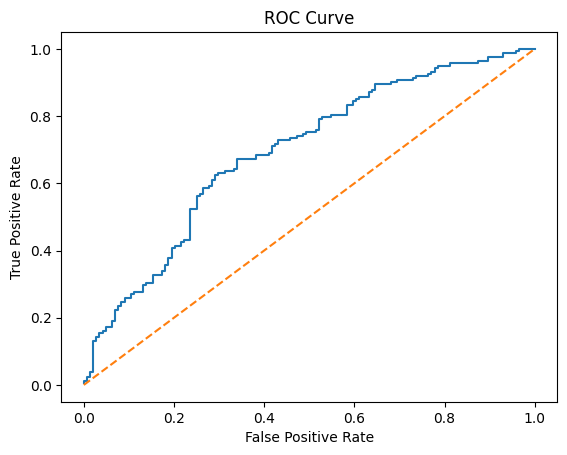

In [458]:
print("=== ROC-AUC Score on Validation Data ===")
X_val_minmax_ones=model3.add_ones_column(X_val_min_max)
y_predictions_val_minmax=model3.predict_probability(X_val_minmax_ones)
tprs_val_minmax,fprs_val_minmax=model3.caclulate_roc(Y_val,y_predictions_val_minmax)
print("AUC Score:",model3.auc_score(tprs_val_minmax,fprs_val_minmax))
model3.plot_roc(tprs_val_minmax,fprs_val_minmax)

=== Confusion Matrix For Testing Data ===
Accuracy: 0.6514657980456026
Precision: 0.6405228758169934
Recall: 0.6533333333333333
F1 Score: 0.6468646864686468


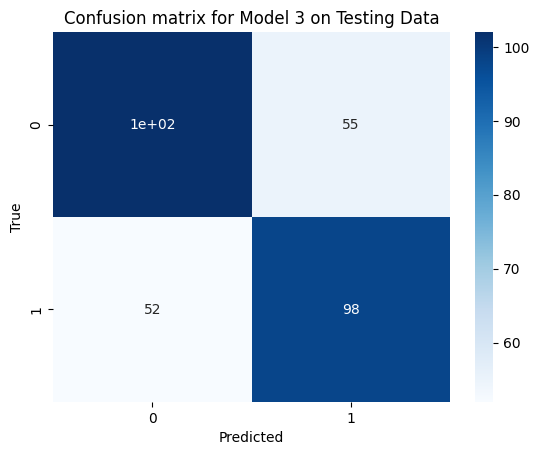

In [459]:
print("=== Confusion Matrix For Testing Data ===")
cm_test_model3=model3.confusion_matrix(X_test_min_max,Y_test)
# print(cm_test_model2)
print("Accuracy:",(cm_test_model3[0][0]+cm_test_model3[1][1])/np.sum(cm_test_model3))
print("Precision:",model3.precision(cm_test_model3))
print("Recall:",model3.recall(cm_test_model3))
print("F1 Score:",model3.f1_score(cm_test_model3))
model3.plot_confusion_matrix(cm_test_model3, "Confusion matrix for Model 3 on Testing Data")


=== ROC-AUC Score on Testing Data ===
AUC Score: 0.6837154989384289


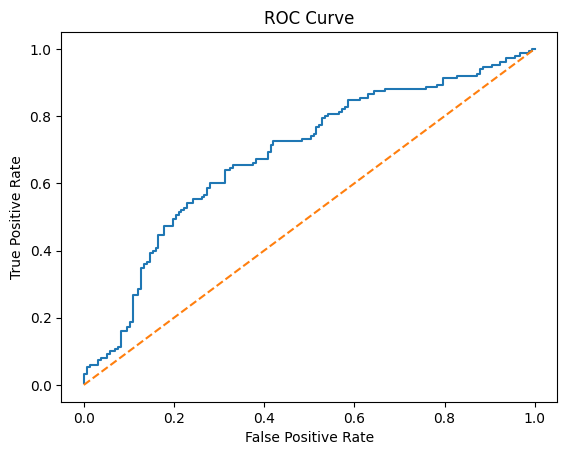

In [460]:
print("=== ROC-AUC Score on Testing Data ===")
X_test_minmax_ones=model3.add_ones_column(X_test_min_max)
y_predictions_test_minmax=model3.predict_probability(X_test_minmax_ones)
tprs_test_minmax,fprs_test_minmax=model3.caclulate_roc(Y_test,y_predictions_test_minmax)
print("AUC Score:",model3.auc_score(tprs_test_minmax,fprs_test_minmax))
model3.plot_roc(tprs_test_minmax,fprs_test_minmax)

(d) **Implement and compare the following optimisation algorithms**

Stochastic Gradient Descent and Mini-Batch Gradient Descent (with varying batch sizes,
at least 2). 

Plot and compare the loss vs. iteration and accuracy vs. iteration for
each method. 

Discuss the trade-offs in terms of convergence speed and stability
between these methods

Implementing Stochastic Gradient Descent

In [461]:
"""
Model 4: Logistic Regression with Stochastic Gradient Descent, No Regularization, No Early Stopping
Data: Min-Max Scaled
The data is min-max scaled to put everything on the same scale and then the model is applied
"""


model4=LogisticRegression(eta=1e-2,iterations=4000,gradient_descent="Stochastic")
print(model4)
    

Model: Logistic Regression, Learning rate (eta): 0.01, Iterations: 4000, Gradient Descent: Stochastic, Regularization: None, Lambda: 0, Batch Size: None


In [462]:
"""    
Fitting the model on the min-max scaled data
"""
model4.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 0.7051148282501757, Training Accuracy: 0.593990216631726
Iteration: 1, Training Loss: 0.7055796597655783, Training Accuracy: 0.5925925925925926
Iteration: 2, Training Loss: 0.7062392749775374, Training Accuracy: 0.5911949685534591
Iteration: 3, Training Loss: 0.7040500918348995, Training Accuracy: 0.5960866526904263
Iteration: 4, Training Loss: 0.7045736024956208, Training Accuracy: 0.5946890286512928
Iteration: 5, Training Loss: 0.7056121966755721, Training Accuracy: 0.5925925925925926
Iteration: 6, Training Loss: 0.7047875440572371, Training Accuracy: 0.5946890286512928
Iteration: 7, Training Loss: 0.7075792980468241, Training Accuracy: 0.5883997204751922
Iteration: 8, Training Loss: 0.7044935837153261, Training Accuracy: 0.5932914046121593
Iteration: 9, Training Loss: 0.7045953137641985, Training Accuracy: 0.5911949685534591
Iteration: 10, Training Loss: 0.7041824435354554, Training Accuracy: 0.5953878406708596
Iteration: 11, Training Loss: 0.70376873695

In [463]:
print("Model4 Final Weights\n",model4.weights)

Model4 Final Weights
 [-1.5701459   0.82075433  0.442601   -0.22795904  0.20397745 -1.08444013
  1.27977072 -2.13771092  0.56683313  0.46293647  1.12935916  2.53117416
 -0.17623246 -0.44986256  2.15970968 -0.70499822]


**Observation:** The model requires a higher number of iterations and a high learning rate to converge. The loss and accuracy plots are noisy, which is expected since stochastic gradient descent (SGD) updates the weights after each individual sample, leading to fluctuations in the updates. Despite the noise, the loss decreases, and the accuracy follows an overall increasing trend.

Stochastic Gradient Descent is faster than batch gradient descent because it updates the weights after processing one sample at a time, rather than waiting to process the entire dataset as in batch gradient descent. This leads to quicker updates but can result in noisier convergence.


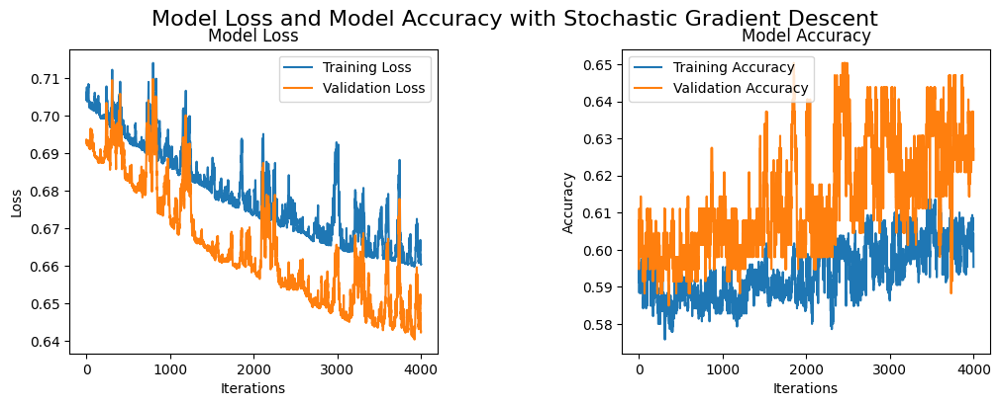

In [464]:
# plot the model loss and model accuracy on the same figure
model4.plot_metrics("Model Loss and Model Accuracy with Stochastic Gradient Descent")

In [465]:
print("=== Evaluating Stochastic Gradient Descent Model on Testing Data ===")
model4.evaluate(X_test_min_max,Y_test)

=== Evaluating Stochastic Gradient Descent Model on Testing Data ===
Accuracy: 0.6579804560260586
Loss: 0.6592550266068156


=== Confusion Matrix For Validation Data ===
Accuracy: 0.6274509803921569
Precision: 0.6538461538461539
Recall: 0.6296296296296297
F1 Score: 0.6415094339622641


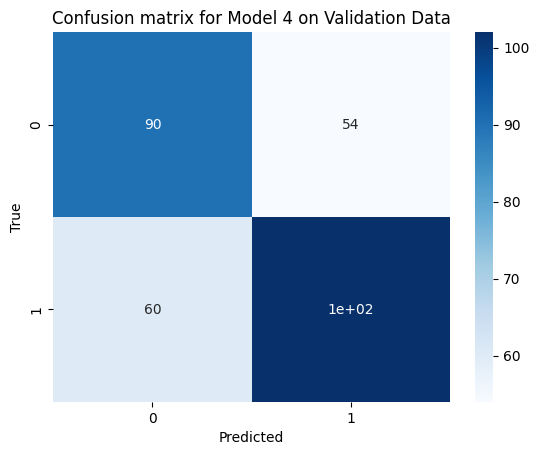

In [466]:
print("=== Confusion Matrix For Validation Data ===")
cm_val_model4=model4.confusion_matrix(X_val_min_max,Y_val)
# print(cm_val_model3)
print("Accuracy:",(cm_val_model4[0][0]+cm_val_model4[1][1])/np.sum(cm_val_model4))
print("Precision:",model1.precision(cm_val_model4))
print("Recall:",model1.recall(cm_val_model4))
print("F1 Score:",model1.f1_score(cm_val_model4))
model4.plot_confusion_matrix(cm_val_model4, "Confusion matrix for Model 4 on Validation Data")

=== ROC-AUC Score on Validation Data ===
AUC Score: 0.6807698902606311


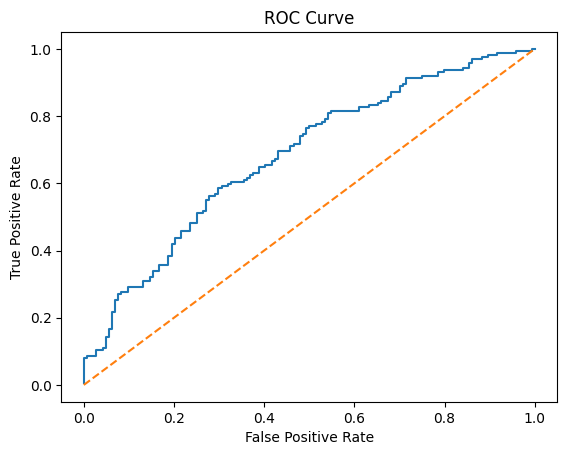

In [467]:
# roc curve
print("=== ROC-AUC Score on Validation Data ===")
X_val_minmax_ones=model4.add_ones_column(X_val_min_max)
y_predictions=model4.predict_probability(X_val_minmax_ones)
tprs,fprs=model4.caclulate_roc(Y_val,y_predictions)
print("AUC Score:",model4.auc_score(tprs,(fprs)))
model4.plot_roc(tprs,fprs)


=== Confusion Matrix For Testing Data ===
Accuracy: 0.6579804560260586
Precision: 0.6490066225165563
Recall: 0.6533333333333333
F1 Score: 0.6511627906976744


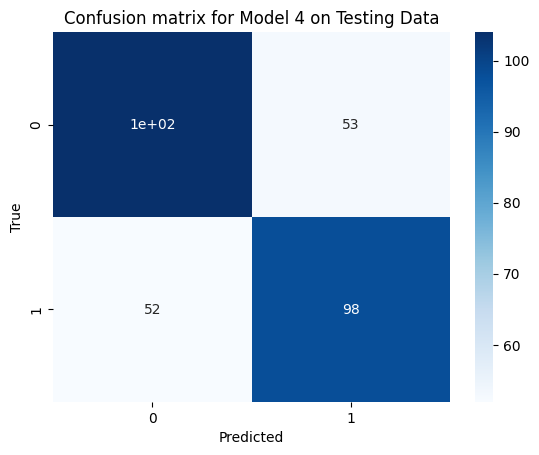

In [468]:
print("=== Confusion Matrix For Testing Data ===")
cm_test_model4=model4.confusion_matrix(X_test_min_max,Y_test)
print("Accuracy:",(cm_test_model4[0][0]+cm_test_model4[1][1])/np.sum(cm_test_model4))
print("Precision:",model3.precision(cm_test_model4))
print("Recall:",model3.recall(cm_test_model4))
print("F1 Score:",model3.f1_score(cm_test_model4))
model4.plot_confusion_matrix(cm_test_model4, "Confusion matrix for Model 4 on Testing Data")

=== ROC-AUC Score on Testing Data ===
AUC Score: 0.6886836518046708


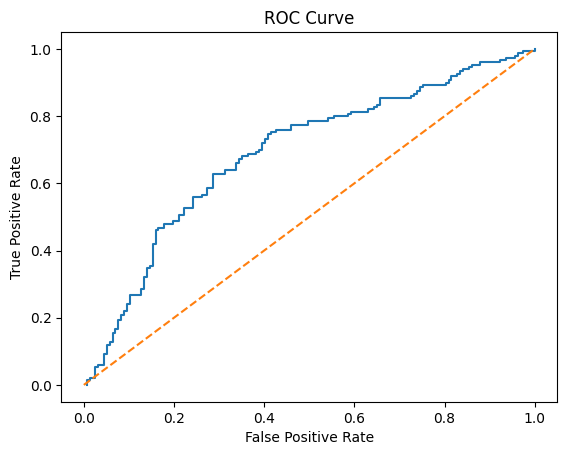

In [469]:
# roc curve
print("=== ROC-AUC Score on Testing Data ===")
X_test_minmax_ones=model4.add_ones_column(X_test_min_max)
y_predictions=model4.predict_probability(X_test_minmax_ones)
tprs,fprs=model4.caclulate_roc(Y_test,y_predictions)
print("AUC Score:",model4.auc_score(tprs,(fprs)))
model4.plot_roc(tprs,fprs)

Implementing Mini-Batch Gradient Descent with varied Batch Sizes: 32,64,128.

In [470]:
"""   
Model 5: Logistic Regression with MiniBatch Gradient Descent, batch size 32, No Regularization, No Early Stopping
Data: Min-Max Scaled
"""

model5=LogisticRegression(eta=1e-3,iterations=1500,gradient_descent="MiniBatch",batch_size=32)
print(model5)


Model: Logistic Regression, Learning rate (eta): 0.001, Iterations: 1500, Gradient Descent: MiniBatch, Regularization: None, Lambda: 0, Batch Size: 32


In [471]:
"""    
Model 6: Logistic Regression with MiniBatch Gradient Descent, batch size 64, No Regularization, No Early Stopping
Data: Min-Max Scaled
"""

model6=LogisticRegression(eta=1e-3,iterations=1500,gradient_descent="MiniBatch",batch_size=64)
print(model6)

Model: Logistic Regression, Learning rate (eta): 0.001, Iterations: 1500, Gradient Descent: MiniBatch, Regularization: None, Lambda: 0, Batch Size: 64


In [472]:
"""    
Model 7: Logistic Regression with MiniBatch Gradient Descent, batch size 128, No Regularization, No Early Stopping
Data: Min-Max Scaled
"""

model7=LogisticRegression(eta=1e-3,iterations=1000,gradient_descent="MiniBatch",batch_size=128)
print(model7)

Model: Logistic Regression, Learning rate (eta): 0.001, Iterations: 1000, Gradient Descent: MiniBatch, Regularization: None, Lambda: 0, Batch Size: 128


In [473]:
#fitting model with batch size 32
model5.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 1.1388345985362074, Training Accuracy: 0.49056603773584906
Iteration: 1, Training Loss: 1.1327463665490998, Training Accuracy: 0.4919636617749825
Iteration: 2, Training Loss: 1.1171180997021688, Training Accuracy: 0.4863731656184486
Iteration: 3, Training Loss: 1.1145733173463959, Training Accuracy: 0.4856743535988819
Iteration: 4, Training Loss: 1.1093778984999882, Training Accuracy: 0.48497554157931516
Iteration: 5, Training Loss: 1.1067012912821126, Training Accuracy: 0.4856743535988819
Iteration: 6, Training Loss: 1.0988844630501113, Training Accuracy: 0.4856743535988819
Iteration: 7, Training Loss: 1.096669448391651, Training Accuracy: 0.4856743535988819
Iteration: 8, Training Loss: 1.0924587303104978, Training Accuracy: 0.4856743535988819
Iteration: 9, Training Loss: 1.0826076137441671, Training Accuracy: 0.48777078965758214
Iteration: 10, Training Loss: 1.0780279487827105, Training Accuracy: 0.4891684136967156
Iteration: 11, Training Loss: 1.07391221

In [474]:
print("Model 5 final weights\n",model5.weights)

Model 5 final weights
 [ 0.13698569  0.26971975 -0.27931066 -0.25207058 -0.33629855  1.17038236
  1.13657114  0.72614195  1.13376622  0.63275578 -0.33887141 -0.0197424
  1.02123371 -1.99844653 -0.06741769  1.35561667]


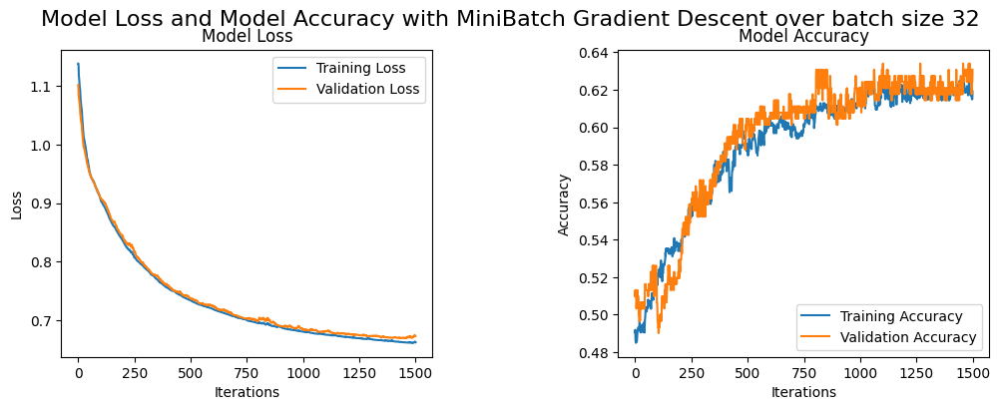

In [475]:
# print("==== Model 5 with MiniBatch Gradient Decent over batch size 32 ====")
model5.plot_metrics("Model Loss and Model Accuracy with MiniBatch Gradient Descent over batch size 32")

In [476]:
print("=== Fitting model 6 implementing mini batch gradient descent with batch size 64 ===")
model6.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

=== Fitting model 6 implementing mini batch gradient descent with batch size 64 ===
Iteration: 0, Training Loss: 0.8070784537396728, Training Accuracy: 0.5562543675751223
Iteration: 1, Training Loss: 0.8015554846586607, Training Accuracy: 0.556953179594689
Iteration: 2, Training Loss: 0.795158860758016, Training Accuracy: 0.5590496156533893
Iteration: 3, Training Loss: 0.7921002143118897, Training Accuracy: 0.5562543675751223
Iteration: 4, Training Loss: 0.7903951459554455, Training Accuracy: 0.5562543675751223
Iteration: 5, Training Loss: 0.7881201723395906, Training Accuracy: 0.556953179594689
Iteration: 6, Training Loss: 0.7854736254309512, Training Accuracy: 0.556953179594689
Iteration: 7, Training Loss: 0.7782497404337979, Training Accuracy: 0.5541579315164221
Iteration: 8, Training Loss: 0.7777203216019385, Training Accuracy: 0.5534591194968553
Iteration: 9, Training Loss: 0.7746026543205377, Training Accuracy: 0.5548567435359888
Iteration: 10, Training Loss: 0.7718694771365878, 

In [477]:
print("Model 6 final weights\n",model6.weights)

Model 6 final weights
 [-1.3062733   0.49876689  1.94751573 -0.09910401  0.61134942 -1.21660628
 -0.04291419  0.19210127  0.75824466  0.6694956   0.16131271 -0.35175007
  0.27039303  0.48062389 -0.80944787 -0.55601624]


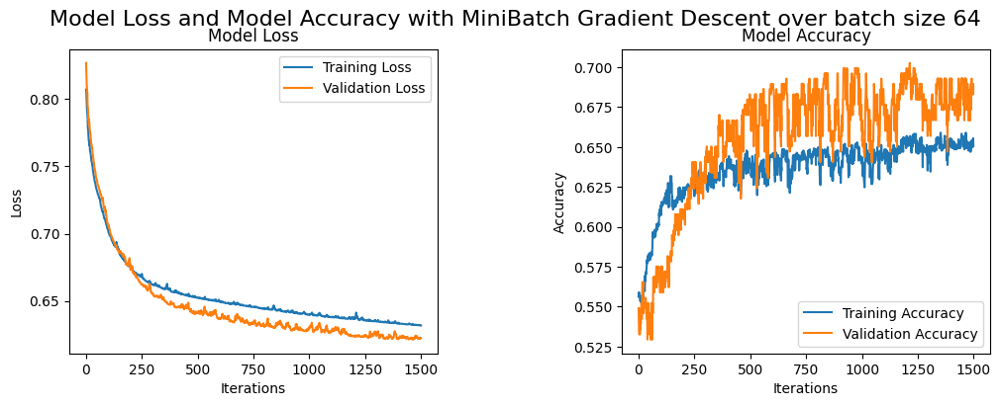

In [478]:
# print("==== Model 5 with MiniBatch Gradient Decent over batch size 64 ====")
model6.plot_metrics("Model Loss and Model Accuracy with MiniBatch Gradient Descent over batch size 64")

In [479]:
# print("=== Fitting model 7 implementing mini batch gradient descent with batch size 128 ===")
model7.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 1.299155597294243, Training Accuracy: 0.5080363382250175
Iteration: 1, Training Loss: 1.2137243265135587, Training Accuracy: 0.5185185185185185
Iteration: 2, Training Loss: 1.1411397435746713, Training Accuracy: 0.5115303983228512
Iteration: 3, Training Loss: 1.0946019533781253, Training Accuracy: 0.5150244584206848
Iteration: 4, Training Loss: 1.060804646831481, Training Accuracy: 0.5206149545772187
Iteration: 5, Training Loss: 1.033202481641522, Training Accuracy: 0.5129280223619846
Iteration: 6, Training Loss: 1.0178723828307223, Training Accuracy: 0.5122292103424179
Iteration: 7, Training Loss: 0.9897577297417491, Training Accuracy: 0.5031446540880503
Iteration: 8, Training Loss: 0.9590179810343455, Training Accuracy: 0.5101327742837177
Iteration: 9, Training Loss: 0.9409464909713199, Training Accuracy: 0.506638714185884
Iteration: 10, Training Loss: 0.9273488937541112, Training Accuracy: 0.5094339622641509
Iteration: 11, Training Loss: 0.91640724242085

In [480]:
print("Model7 Final Weights\n",model7.weights)

Model7 Final Weights
 [-1.31188091  0.39356848  1.74872335 -0.1040901  -0.07768085  0.74544342
  0.47498982  0.39864109  0.53771075  0.57922937 -0.80757787  0.46454634
  0.09415812  0.57260335  0.16038751  0.39287913]


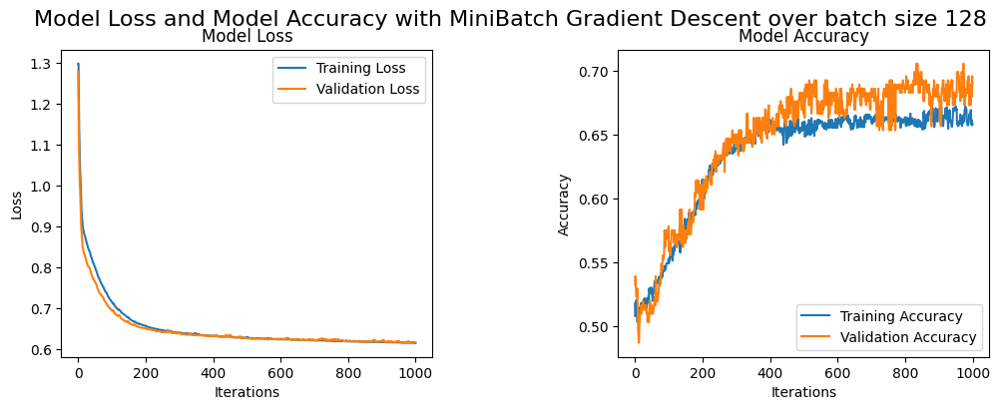

In [481]:
# print("==== Model 6 with MiniBatch Gradient Decent over batch size 128 ====")
model7.plot_metrics("Model Loss and Model Accuracy with MiniBatch Gradient Descent over batch size 128")

**Observation from the plots:**

As the batch size increases in mini-batch gradient descent, the noise in the loss and accuracy curves decreases. This is because larger batch sizes allow for more stable gradient estimates, which smooth out the updates during training. In contrast, smaller batch sizes introduce more noise into the gradient calculations, leading to fluctuations in the loss and accuracy curves.

Additionally, as the batch size increases, the model requires fewer iterations to converge. This is because larger batches provide more representative samples of the entire dataset in each step, allowing the model to make more informed weight updates. While this leads to more stable and faster convergence, it also increases the computational load per iteration compared to smaller batch sizes.


**Smaller batch sizes**: More noise in the curves, longer to converge.

**Larger batch sizes**: Smoother curves, fewer iterations needed for convergence, but with higher computational cost per iteration.


=== Model 5 metrics on Validation Set ===
Accuracy: 0.6241830065359477
Precision: 0.6974789915966386
Recall: 0.5123456790123457
F1 Score: 0.5907473309608541


=== Model 6 metrics on Validation Set  ===
Accuracy: 0.6862745098039216
Precision: 0.7171052631578947
Recall: 0.6728395061728395
F1 Score: 0.694267515923567


=== Model 7 metrics on Validation Set ===
Accuracy: 0.6928104575163399
Precision: 0.7048192771084337
Recall: 0.7222222222222222
F1 Score: 0.7134146341463414




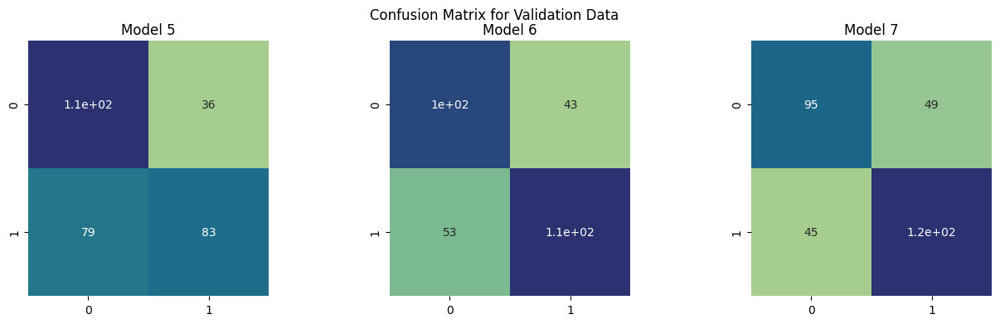

In [482]:
"""     
Evaluating the confusion matrix and other metrics on the validation set
1. MiniBatch Gradient Descent with batch size 32
2. MiniBatch Gradient Descent with batch size 64
3. MiniBatch Gradient Descent with batch size 128
"""


cm_val_model5=model5.confusion_matrix(X_val_min_max,Y_val)
cm_val_model6=model6.confusion_matrix(X_val_min_max,Y_val)
cm_val_model7=model7.confusion_matrix(X_val_min_max,Y_val)

#plot on the same figure
fig, axes = plt.subplots(1, 3, figsize=(15, 4) )
# add title to the figure
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)
fig.suptitle('Confusion Matrix for Validation Data')

axes[0].set_title("Model 5")
print("=== Model 5 metrics on Validation Set ===")
print("Accuracy:", (cm_val_model5[0][0]+cm_val_model5[1][1])/np.sum(cm_val_model5)) 
print("Precision:",model5.precision(cm_val_model5))
print("Recall:",model5.recall(cm_val_model5))
print("F1 Score:",model5.f1_score(cm_val_model5))
print("======================================\n\n")
sns.heatmap(cm_val_model5,annot=True, cmap="crest",ax=axes[0],cbar=False)

axes[1].set_title("Model 6")
print("=== Model 6 metrics on Validation Set  ===")
print("Accuracy:", (cm_val_model6[0][0]+cm_val_model6[1][1])/np.sum(cm_val_model6))
print("Precision:",model6.precision(cm_val_model6))
print("Recall:",model6.recall(cm_val_model6))
print("F1 Score:",model6.f1_score(cm_val_model6))
print("======================================\n\n")
sns.heatmap(cm_val_model6,annot=True, cmap="crest",ax=axes[1],cbar=False)

axes[2].set_title("Model 7")
print("=== Model 7 metrics on Validation Set ===")
print("Accuracy:", (cm_val_model7[0][0]+cm_val_model7[1][1])/np.sum(cm_val_model7))
print("Precision:",model7.precision(cm_val_model7))
print("Recall:",model7.recall(cm_val_model7))
print("F1 Score:",model7.f1_score(cm_val_model7))
print("======================================\n\n")
sns.heatmap(cm_val_model7,annot=True, cmap="crest",ax=axes[2],cbar=False)

plt.show()


=== Model 5 ROC Curve On Validation Set ===
AUC Score: 0.6807698902606311


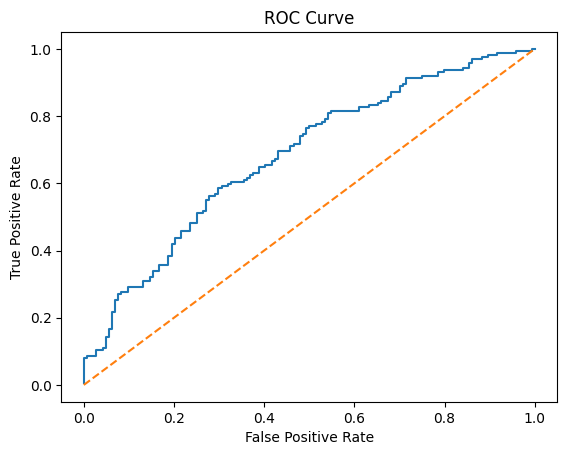

In [483]:
#plotting roc curves
print("=== Model 5 ROC Curve On Validation Set ===")
X_val_minmax_ones=model5.add_ones_column(X_val_min_max)
y_predictions=model4.predict_probability(X_val_minmax_ones)
tprs,fprs=model4.caclulate_roc(Y_val,y_predictions)
print("AUC Score:",model5.auc_score(tprs,(fprs)))
model5.plot_roc(tprs,fprs)

=== Model 6 ROC Curve On Validation Set ===
AUC Score: 0.6483196159122084


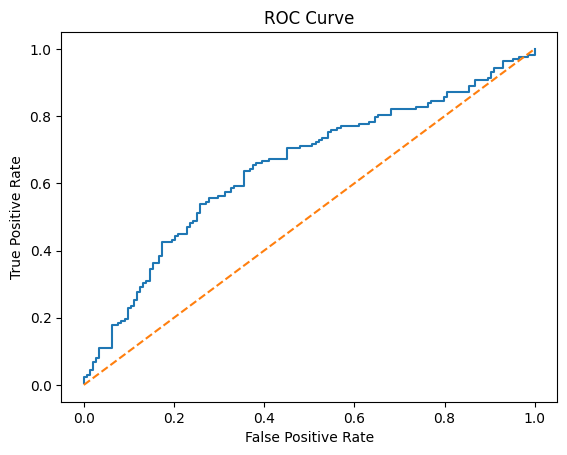

In [484]:
print("=== Model 6 ROC Curve On Validation Set ===")
X_val_minmax_ones=model6.add_ones_column(X_val_min_max)
y_predictions=model5.predict_probability(X_val_minmax_ones)
tprs,fprs=model5.caclulate_roc(Y_val,y_predictions)
print("AUC Score:",model6.auc_score(tprs,(fprs)))
model6.plot_roc(tprs,fprs)

=== Model 7 ROC Curve On Validation Set ===
AUC Score: 0.7267661179698217


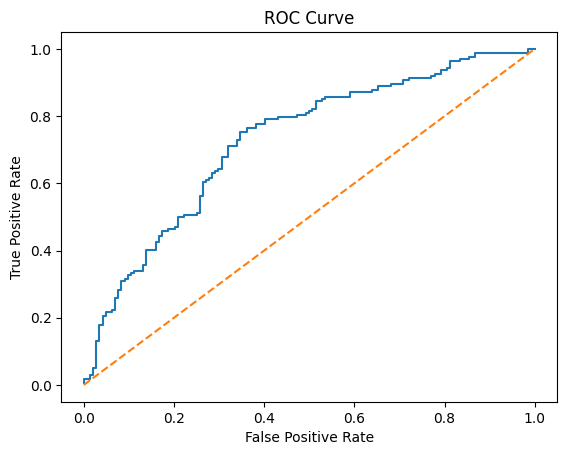

In [485]:
print("=== Model 7 ROC Curve On Validation Set ===")
X_val_minmax_ones=model7.add_ones_column(X_val_min_max)
y_predictions=model7.predict_probability(X_val_minmax_ones)
tprs,fprs=model7.caclulate_roc(Y_val,y_predictions)
print("AUC Score:",model6.auc_score(tprs,(fprs)))
model7.plot_roc(tprs,fprs)

=== Model 5 metrics on Testing Set ===
Accuracy: 0.6286644951140065
Precision: 0.6451612903225806
Recall: 0.5333333333333333
F1 Score: 0.583941605839416


=== Model 6 metrics on Testing Set ===
Accuracy: 0.6872964169381107
Precision: 0.6708860759493671
Recall: 0.7066666666666667
F1 Score: 0.6883116883116883


=== Model 7 metrics on Testing Set ===
Accuracy: 0.6579804560260586
Precision: 0.6331360946745562
Recall: 0.7133333333333334
F1 Score: 0.6708463949843261




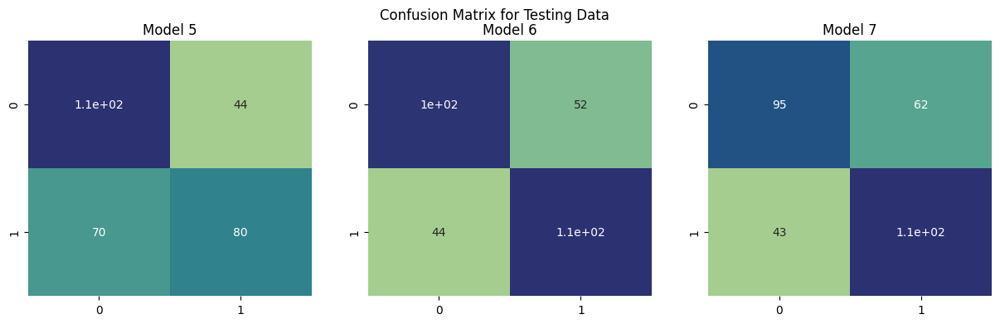

In [486]:
"""     
Evaluating the confusion matrix and other metrics on the testing set
1. MiniBatch Gradient Descent with batch size 32
2. MiniBatch Gradient Descent with batch size 64
3. MiniBatch Gradient Descent with batch size 128
"""


cm_test_model5=model5.confusion_matrix(X_test_min_max,Y_test)
cm_test_model6=model6.confusion_matrix(X_test_min_max,Y_test)
cm_test_model7=model7.confusion_matrix(X_test_min_max,Y_test)

#plot on the same figure
fig, axes = plt.subplots(1, 3, figsize=(15, 4) )

fig.suptitle('Confusion Matrix for Testing Data')

axes[0].set_title("Model 5")
print("=== Model 5 metrics on Testing Set ===")
print("Accuracy:", (cm_test_model5[0][0]+cm_test_model5[1][1])/np.sum(cm_test_model5))
print("Precision:",model5.precision(cm_test_model5))
print("Recall:",model5.recall(cm_test_model5))
print("F1 Score:",model5.f1_score(cm_test_model5))
print("======================================\n\n")
sns.heatmap(cm_test_model5,annot=True, cmap="crest",ax=axes[0],cbar=False)

axes[1].set_title("Model 6")
print("=== Model 6 metrics on Testing Set ===")
print("Accuracy:", (cm_test_model6[0][0]+cm_test_model6[1][1])/np.sum(cm_test_model6))
print("Precision:",model6.precision(cm_test_model6))
print("Recall:",model6.recall(cm_test_model6))
print("F1 Score:",model6.f1_score(cm_test_model6))
print("======================================\n\n")
sns.heatmap(cm_test_model6,annot=True, cmap="crest",ax=axes[1],cbar=False)

axes[2].set_title("Model 7")
print("=== Model 7 metrics on Testing Set ===")
print("Accuracy:", (cm_test_model7[0][0]+cm_test_model7[1][1])/np.sum(cm_test_model7))
print("Precision:",model7.precision(cm_test_model7))
print("Recall:",model7.recall(cm_test_model7))
print("F1 Score:",model7.f1_score(cm_test_model7))

print("======================================\n\n")
sns.heatmap(cm_test_model7,annot=True, cmap="crest",ax=axes[2],cbar=False)

plt.show()

=== Model 5 ROC Curve On Testing Set ===
AUC Score: 0.6659447983014861


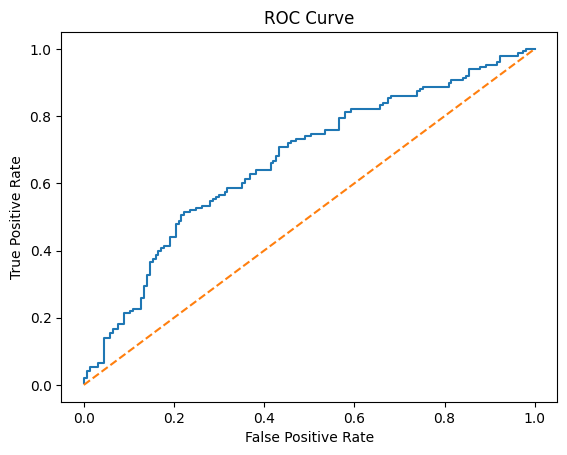

In [487]:
print("=== Model 5 ROC Curve On Testing Set ===")
X_test_minmax_ones=model5.add_ones_column(X_test_min_max)
y_predictions=model5.predict_probability(X_test_minmax_ones)
tprs,fprs=model5.caclulate_roc(Y_test,y_predictions)
print("AUC Score:",model5.auc_score(tprs,(fprs)))
model5.plot_roc(tprs,fprs)

=== Model 6 ROC Curve On Testing Set ===
AUC Score: 0.7246284501061572


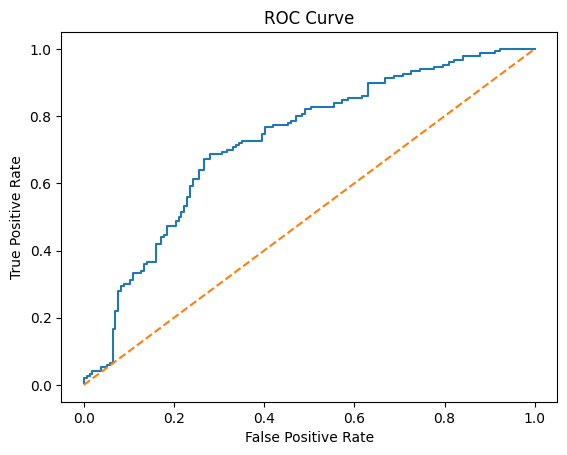

In [488]:
print("=== Model 6 ROC Curve On Testing Set ===")
X_test_minmax_ones=model6.add_ones_column(X_test_min_max)
y_predictions=model6.predict_probability(X_test_minmax_ones)
tprs,fprs=model6.caclulate_roc(Y_test,y_predictions)
print("AUC Score:",model6.auc_score(tprs,(fprs)))
model6.plot_roc(tprs,fprs)

=== Model 7 ROC Curve On Testing Set ===
AUC Score: 0.722823779193206


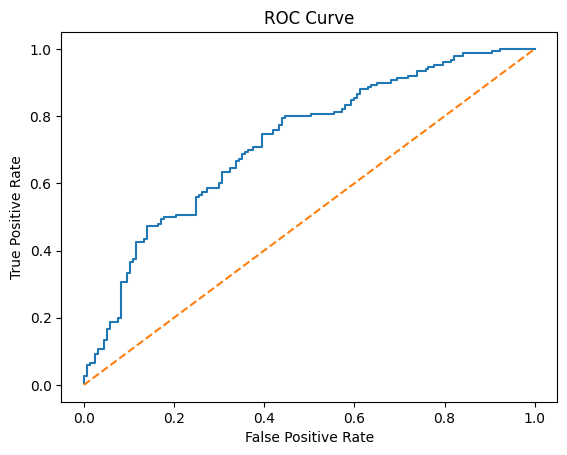

In [489]:
print("=== Model 7 ROC Curve On Testing Set ===")
X_test_minmax_ones=model7.add_ones_column(X_test_min_max)
y_predictions=model7.predict_probability(X_test_minmax_ones)
tprs,fprs=model7.caclulate_roc(Y_test,y_predictions)
print("AUC Score:",model7.auc_score(tprs,(fprs)))
model7.plot_roc(tprs,fprs)


(e) **Implement k-fold cross-validation (with k=5) to assess the robustness of your model**

Report the average and standard deviation for accuracy, precision,
recall, and F1 score across the folds. 

Discuss the stability and variance of the
model’s performance across different folds 

K-fold cross-validation is a robust technique used to evaluate the performance of a model on the entire training and validation set. It works by dividing the dataset into **K equal-sized folds** or subsets. The process involves training the model **K times**, where in each iteration, one fold is left out as the **validation set**, and the model is trained on the remaining **K-1 folds**.

Process:
1. **Split the dataset into K folds**: The dataset is randomly shuffled and divided into K equal parts.
2. **Train on K-1 folds**: In each iteration, a different fold is left out as the validation set, while the remaining K-1 folds are used to train the model.
3. **Validate on the remaining fold**: The model’s performance is tested on the fold that was left out.
4. **Repeat this K times**: Each fold gets a chance to be used as the validation set exactly once.
5. **Average the results**: After completing all K iterations, the model's performance (e.g., accuracy, precision, etc.) is averaged over the K runs to provide a more generalized measure of its effectiveness.

In **5-fold cross-validation**:
- The dataset is divided into 5 folds.
- In each iteration, 4 folds are used for training, and the remaining fold is used for validation.
- This process repeats 5 times, with each fold being used as the validation set once.

At the end of the 5 iterations, the results are averaged to provide a more reliable estimate of how the model will perform on unseen data.

K-fold cross-validation provides a comprehensive way of evaluating model performance by leveraging the entire dataset, thus giving a more realistic understanding of how well the model generalizes to new data.


In [490]:
#club train and val for K fold cross validation

X_train_Kfold=np.concatenate((X_train,X_val), axis=0)
Y_train_Kfold=np.concatenate((Y_train,Y_val),axis=0)

print("Shape of concatenated data (inputs X):",X_train_Kfold.shape)
print("Shape of concatenated data (outputs Y):",Y_train_Kfold.shape)


Shape of concatenated data (inputs X): (1737, 15)
Shape of concatenated data (outputs Y): (1737,)


Evaluating batch gradient descent using K fold cross validation

In [491]:
"""    
Initialising the lists to store the results from the K fold cross validation
"""
K=5
training_accuracies=[]
training_losses=[]
validation_accuracies=[]
validation_losses=[]
validation_precisions=[]
validation_accuracies=[]
validation_loss=[]
validation_accuracy=[]
validation_recalls=[]
validation_f1_score=[]
weights=[]

In [492]:
"""     
Start the K fold cross validation technique to evaluate the model
Iterate over the K folds and train the model on K-1 folds and validate on the remaining fold
Calculate the metrics and store them in the lists initialised above
"""

for i in range(K):
    X_val_new=X_train_Kfold[i*int(len(X_train_Kfold)/K):(i+1)*int(len(X_train_Kfold)/K)]
    Y_val_new=Y_train_Kfold[i*int(len(Y_train_Kfold)/K):(i+1)*int(len(Y_train_Kfold)/K)]
    X_train_new=np.concatenate((X_train_Kfold[:i*int(len(X_train_Kfold)/K)],X_train_Kfold[(i+1)*int(len(X_train_Kfold)/K):]),axis=0)
    Y_train_new=np.concatenate((Y_train_Kfold[:i*int(len(Y_train_Kfold)/K)],Y_train_Kfold[(i+1)*int(len(Y_train_Kfold)/K):]),axis=0)

    max=np.max(X_train_new,axis=0)
    min=np.min(X_train_new,axis=0)

    X_train_new=(X_train_new-min)/(max-min)
    X_val_new=(X_val_new-min)/(max-min)

    model_Kfold=LogisticRegression(eta=1e-3,iterations=125)
    model_Kfold.fit(X_train_new,Y_train_new,X_val_new,Y_val_new)

    training_accuracies.append(model_Kfold.accuracies)
    training_losses.append(model_Kfold.losses)
    validation_accuracies.append(model_Kfold.validation_accuracies)
    validation_losses.append(model_Kfold.validation_losses)


    cm=model_Kfold.confusion_matrix(X_val_new,Y_val_new)
    validation_precisions.append(model_Kfold.precision(cm))
    validation_recalls.append(model_Kfold.recall(cm))
    validation_f1_score.append(model_Kfold.f1_score(cm))
    validation_accuracy.append((cm[0][0]+cm[1][1])/np.sum(cm))
    validation_loss.append(model_Kfold.loss(model_Kfold.add_ones_column(X_val_new),Y_val_new))
    weights.append(model_Kfold.weights)

   

Iteration: 0, Training Loss: 0.7182537164599233, Training Accuracy: 0.5676258992805755
Iteration: 1, Training Loss: 0.6802977226712951, Training Accuracy: 0.6093525179856115
Iteration: 2, Training Loss: 0.6723000683714774, Training Accuracy: 0.6143884892086331
Iteration: 3, Training Loss: 0.666867254805854, Training Accuracy: 0.616546762589928
Iteration: 4, Training Loss: 0.6622137116383249, Training Accuracy: 0.6266187050359712
Iteration: 5, Training Loss: 0.6581338422811773, Training Accuracy: 0.6244604316546762
Iteration: 6, Training Loss: 0.6545395098751049, Training Accuracy: 0.6280575539568345
Iteration: 7, Training Loss: 0.6513618594975786, Training Accuracy: 0.6309352517985611
Iteration: 8, Training Loss: 0.648543042447436, Training Accuracy: 0.6366906474820144
Iteration: 9, Training Loss: 0.6460341232983549, Training Accuracy: 0.637410071942446
Iteration: 10, Training Loss: 0.6437936135597297, Training Accuracy: 0.639568345323741
Iteration: 11, Training Loss: 0.641786255709402

In [493]:
"""   
Converting the lists to numpy arrays for easy calculations
"""

training_accuracies=np.array(training_accuracies)
training_losses=np.array(training_losses)
validation_accuracies=np.array(validation_accuracies)
validation_losses=np.array(validation_losses)
losses=np.array(validation_loss)
precisions=np.array(validation_precisions)
recalls=np.array(validation_recalls)
f1_score=np.array(validation_f1_score)
accuracies=np.array(validation_accuracy)



In [494]:
print("Evaluation of Batch Gradient Descent Model on K Fold Cross Validation") 

#displaying the average metrics across folds
print("=== Average Metrics Across Folds on validation data ===")
print("Accuracy:",np.mean(accuracies))
print("Loss:",np.mean(losses))   
print("Precision:",np.mean(precisions))
print("Recall:",np.mean(recalls))
print("F1 Score:",np.mean(f1_score, axis=0))

print("\n")
#displaying the standard deviation of metrics across folds
print("=== Standard deviation of Metrics Across Folds on validation data ===")
print("Accuracy:",np.std(accuracies))
print("Loss:",np.std(losses))
print("Precision:",np.std(precisions))
print("Recall:",np.std(recalls))
print("F1 Score:",np.std(f1_score, axis=0))

Evaluation of Batch Gradient Descent Model on K Fold Cross Validation
=== Average Metrics Across Folds on validation data ===
Accuracy: 0.661671469740634
Loss: 0.6205279027303213
Precision: 0.6660781670564014
Recall: 0.6936872530770516
F1 Score: 0.678549625320761


=== Standard deviation of Metrics Across Folds on validation data ===
Accuracy: 0.02221825391054337
Loss: 0.011407656847027709
Precision: 0.02489185134696217
Recall: 0.03753144466590164
F1 Score: 0.015731701603752004


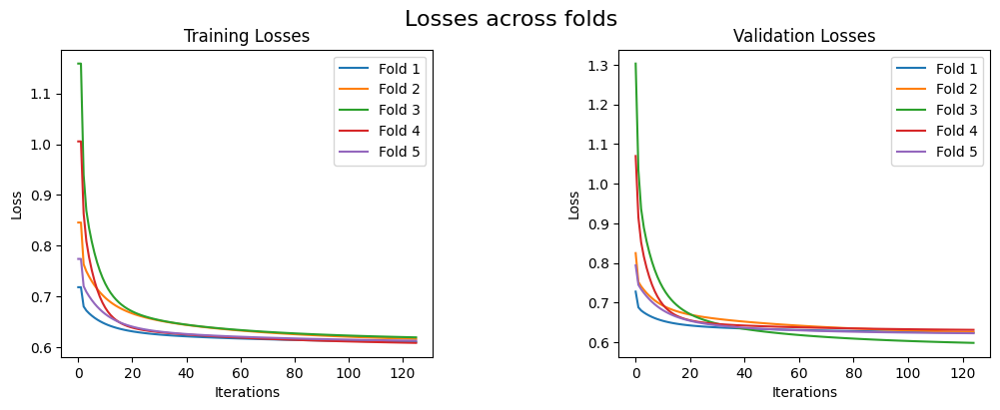

In [495]:
#plotting the loss across folds
fig,axes=plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)

fig.suptitle('Losses across folds', fontsize=16)

for i in range(K):
    axes[0].plot(training_losses[i])
    axes[1].plot(validation_losses[i])

axes[0].set_title("Training Losses")    
axes[0].set_xlabel("Iterations")
axes[0].set_ylabel("Loss")
axes[0].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

axes[1].set_title("Validation Losses")
axes[1].set_xlabel("Iterations")
axes[1].set_ylabel("Loss")
axes[1].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

plt.show()



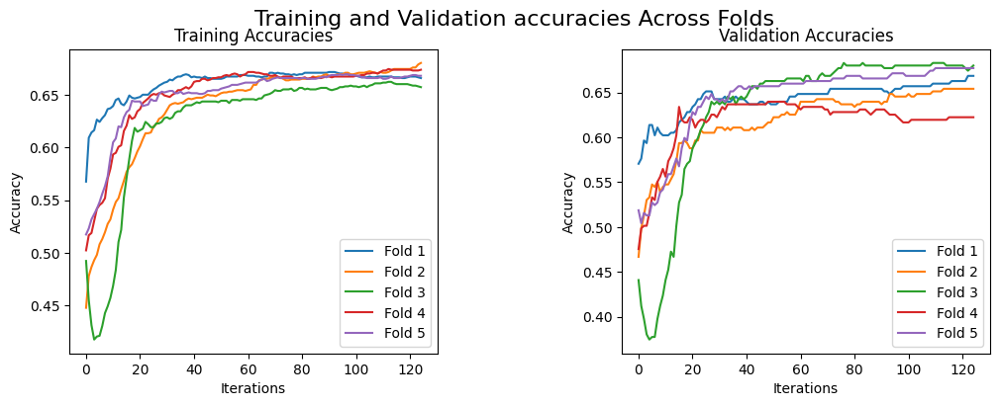

In [496]:
#plotting the accuracies across folds
fig,axes=plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)

fig.suptitle('Training and Validation accuracies Across Folds', fontsize=16)

for i in range(K):
    axes[0].plot(training_accuracies[i])
    axes[1].plot(validation_accuracies[i])

axes[0].set_title("Training Accuracies")
axes[0].set_xlabel("Iterations")
axes[0].set_ylabel("Accuracy")
axes[0].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

axes[1].set_title("Validation Accuracies")
axes[1].set_xlabel("Iterations")
axes[1].set_ylabel("Accuracy")
axes[1].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

plt.show()




Evaluating Stochastic gradient descent using K fold cross validation

In [497]:
K=5
training_accuracies=[]
training_losses=[]
validation_accuracies=[]
validation_losses=[]
validation_precisions=[]
validation_accuracies=[]
validation_loss=[]
validation_accuracy=[]
validation_recalls=[]
validation_f1_score=[]
weights=[]

In [498]:
for i in range(K):
    X_val_new=X_train_Kfold[i*int(len(X_train_Kfold)/K):(i+1)*int(len(X_train_Kfold)/K)]
    Y_val_new=Y_train_Kfold[i*int(len(Y_train_Kfold)/K):(i+1)*int(len(Y_train_Kfold)/K)]
    X_train_new=np.concatenate((X_train_Kfold[:i*int(len(X_train_Kfold)/K)],X_train_Kfold[(i+1)*int(len(X_train_Kfold)/K):]),axis=0)
    Y_train_new=np.concatenate((Y_train_Kfold[:i*int(len(Y_train_Kfold)/K)],Y_train_Kfold[(i+1)*int(len(Y_train_Kfold)/K):]),axis=0)

    max=np.max(X_train_new,axis=0)
    min=np.min(X_train_new,axis=0)

    X_train_new=(X_train_new-min)/(max-min)
    X_val_new=(X_val_new-min)/(max-min)

    model_Kfold=LogisticRegression(eta=1e-2,iterations=5000, gradient_descent="Stochastic")
    model_Kfold.fit(X_train_new,Y_train_new,X_val_new,Y_val_new)

    training_accuracies.append(model_Kfold.accuracies)
    training_losses.append(model_Kfold.losses)
    validation_accuracies.append(model_Kfold.validation_accuracies)
    validation_losses.append(model_Kfold.validation_losses)


    cm=model_Kfold.confusion_matrix(X_val_new,Y_val_new)
    validation_precisions.append(model_Kfold.precision(cm))
    validation_recalls.append(model_Kfold.recall(cm))
    validation_f1_score.append(model_Kfold.f1_score(cm))
    validation_accuracy.append((cm[0][0]+cm[1][1])/np.sum(cm))
    validation_loss.append(model_Kfold.loss(model_Kfold.add_ones_column(X_val_new),Y_val_new))
    weights.append(model_Kfold.weights)

   

Iteration: 0, Training Loss: 0.7097750458459411, Training Accuracy: 0.6100719424460431
Iteration: 1, Training Loss: 0.7110044557193145, Training Accuracy: 0.6100719424460431
Iteration: 2, Training Loss: 0.7115908898355672, Training Accuracy: 0.6100719424460431
Iteration: 3, Training Loss: 0.7123883744958931, Training Accuracy: 0.6093525179856115
Iteration: 4, Training Loss: 0.713179049263801, Training Accuracy: 0.6086330935251798
Iteration: 5, Training Loss: 0.7142402279616762, Training Accuracy: 0.6086330935251798
Iteration: 6, Training Loss: 0.7129053854520696, Training Accuracy: 0.6086330935251798
Iteration: 7, Training Loss: 0.7135232054616484, Training Accuracy: 0.6071942446043166
Iteration: 8, Training Loss: 0.7126854031792345, Training Accuracy: 0.6086330935251798
Iteration: 9, Training Loss: 0.709278359538791, Training Accuracy: 0.6122302158273382
Iteration: 10, Training Loss: 0.7097232592244263, Training Accuracy: 0.6107913669064748
Iteration: 11, Training Loss: 0.710230858857

In [499]:
training_accuracies=np.array(training_accuracies)
training_losses=np.array(training_losses)
validation_accuracies=np.array(validation_accuracies)
validation_losses=np.array(validation_losses)
losses=np.array(validation_loss)
precisions=np.array(validation_precisions)
recalls=np.array(validation_recalls)
f1_score=np.array(validation_f1_score)
accuracies=np.array(validation_accuracy)

In [500]:
print("Evaluation of Stochastic Gradient Descent Model on K Fold Cross Validation")

#displaying the average metrics across folds
print("=== Average Metrics Across Folds on validation data ===")
print("Accuracy:",np.mean(accuracies))
print("Loss:",np.mean(losses))   
print("Precision:",np.mean(precisions))
print("Recall:",np.mean(recalls))
print("F1 Score:",np.mean(f1_score, axis=0))

print("\n")
#displaying the standard deviation of metrics across folds
print("=== Standard deviation of Metrics Across Folds on validation data ===")
print("Accuracy:",np.std(accuracies))
print("Loss:",np.std(losses))
print("Precision:",np.std(precisions))
print("Recall:",np.std(recalls))
print("F1 Score:",np.std(f1_score, axis=0))

Evaluation of Stochastic Gradient Descent Model on K Fold Cross Validation
=== Average Metrics Across Folds on validation data ===
Accuracy: 0.6455331412103746
Loss: 0.6469350949706587
Precision: 0.6503719505569594
Recall: 0.6791417390399017
F1 Score: 0.6612502445327778


=== Standard deviation of Metrics Across Folds on validation data ===
Accuracy: 0.02319839976656843
Loss: 0.013222555350491006
Precision: 0.00868482007547143
Recall: 0.08342753137784296
F1 Score: 0.03986925852152471


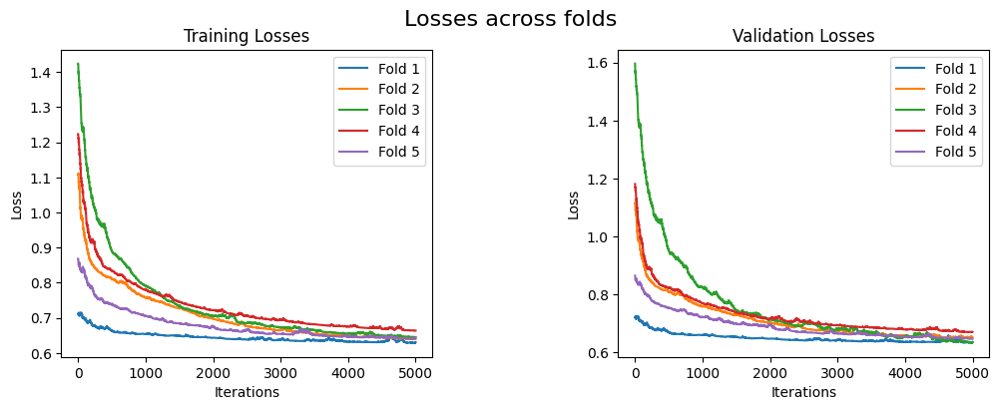

In [501]:
#plotting the loss across folds
fig,axes=plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)

fig.suptitle('Losses across folds', fontsize=16)

for i in range(K):
    axes[0].plot(training_losses[i])
    axes[1].plot(validation_losses[i])

axes[0].set_title("Training Losses")    
axes[0].set_xlabel("Iterations")
axes[0].set_ylabel("Loss")
axes[0].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

axes[1].set_title("Validation Losses")
axes[1].set_xlabel("Iterations")
axes[1].set_ylabel("Loss")
axes[1].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

plt.show()



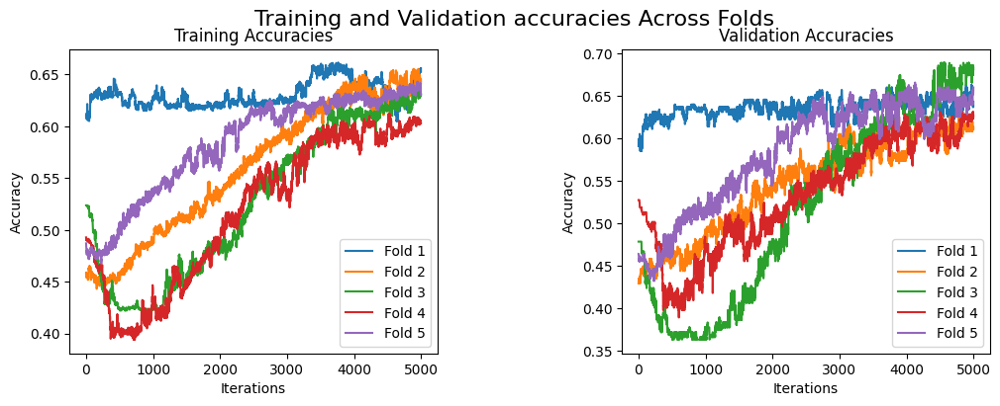

In [502]:
#plotthing the accuracies across folds
fig,axes=plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)

fig.suptitle('Training and Validation accuracies Across Folds', fontsize=16)

for i in range(K):
    axes[0].plot(training_accuracies[i])
    axes[1].plot(validation_accuracies[i])

axes[0].set_title("Training Accuracies")
axes[0].set_xlabel("Iterations")
axes[0].set_ylabel("Accuracy")
axes[0].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

axes[1].set_title("Validation Accuracies")
axes[1].set_xlabel("Iterations")
axes[1].set_ylabel("Accuracy")
axes[1].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

plt.show()




Evaluating mini batch gradient descent with 32 batch size

In [503]:
K=5
training_accuracies=[]
training_losses=[]
validation_accuracies=[]
validation_losses=[]
validation_precisions=[]
validation_accuracies=[]
validation_loss=[]
validation_accuracy=[]
validation_recalls=[]
validation_f1_score=[]
weights=[]

In [504]:
for i in range(K):
    X_val_new=X_train_Kfold[i*int(len(X_train_Kfold)/K):(i+1)*int(len(X_train_Kfold)/K)]
    Y_val_new=Y_train_Kfold[i*int(len(Y_train_Kfold)/K):(i+1)*int(len(Y_train_Kfold)/K)]
    X_train_new=np.concatenate((X_train_Kfold[:i*int(len(X_train_Kfold)/K)],X_train_Kfold[(i+1)*int(len(X_train_Kfold)/K):]),axis=0)
    Y_train_new=np.concatenate((Y_train_Kfold[:i*int(len(Y_train_Kfold)/K)],Y_train_Kfold[(i+1)*int(len(Y_train_Kfold)/K):]),axis=0)

    max=np.max(X_train_new,axis=0)
    min=np.min(X_train_new,axis=0)

    X_train_new=(X_train_new-min)/(max-min)
    X_val_new=(X_val_new-min)/(max-min)

    model_Kfold=LogisticRegression(eta=1e-2,iterations=1500, gradient_descent="MiniBatch",batch_size=32)
    model_Kfold.fit(X_train_new,Y_train_new,X_val_new,Y_val_new)

    training_accuracies.append(model_Kfold.accuracies)
    training_losses.append(model_Kfold.losses)
    validation_accuracies.append(model_Kfold.validation_accuracies)
    validation_losses.append(model_Kfold.validation_losses)


    cm=model_Kfold.confusion_matrix(X_val_new,Y_val_new)
    validation_precisions.append(model_Kfold.precision(cm))
    validation_recalls.append(model_Kfold.recall(cm))
    validation_f1_score.append(model_Kfold.f1_score(cm))
    validation_accuracy.append((cm[0][0]+cm[1][1])/np.sum(cm))
    validation_loss.append(model_Kfold.loss(model_Kfold.add_ones_column(X_val_new),Y_val_new))
    weights.append(model_Kfold.weights)

   

Iteration: 0, Training Loss: 0.8989495514435644, Training Accuracy: 0.5201438848920863
Iteration: 1, Training Loss: 0.8678360116212905, Training Accuracy: 0.5352517985611511
Iteration: 2, Training Loss: 0.8401014553832031, Training Accuracy: 0.5381294964028777
Iteration: 3, Training Loss: 0.8187102291834164, Training Accuracy: 0.5410071942446043
Iteration: 4, Training Loss: 0.7824391305647713, Training Accuracy: 0.5453237410071943
Iteration: 5, Training Loss: 0.7522187771900166, Training Accuracy: 0.5388489208633094
Iteration: 6, Training Loss: 0.7388449036262469, Training Accuracy: 0.5402877697841727
Iteration: 7, Training Loss: 0.743983913434123, Training Accuracy: 0.5431654676258992
Iteration: 8, Training Loss: 0.743093581301557, Training Accuracy: 0.543884892086331
Iteration: 9, Training Loss: 0.73616655829316, Training Accuracy: 0.5453237410071943
Iteration: 10, Training Loss: 0.7274065018700445, Training Accuracy: 0.5460431654676259
Iteration: 11, Training Loss: 0.720507042395916

In [505]:
training_accuracies=np.array(training_accuracies)
training_losses=np.array(training_losses)
validation_accuracies=np.array(validation_accuracies)
validation_losses=np.array(validation_losses)
losses=np.array(validation_loss)
precisions=np.array(validation_precisions)
recalls=np.array(validation_recalls)
f1_score=np.array(validation_f1_score)
accuracies=np.array(validation_accuracy)


In [506]:
print("Evaluation of MiniBatch Gradient Descent Model with batch size 32 on K Fold Cross Validation")

#displaying the average metrics across folds
print("=== Average Metrics Across Folds on validation data ===")
print("Accuracy:",np.mean(accuracies))
print("Loss:",np.mean(losses))   
print("Precision:",np.mean(precisions))
print("Recall:",np.mean(recalls))
print("F1 Score:",np.mean(f1_score, axis=0))

print("\n")
#displaying the standard deviation of metrics across folds
print("=== Standard deviation of Metrics Across Folds on validation data ===")
print("Accuracy:",np.std(accuracies))
print("Loss:",np.std(losses))
print("Precision:",np.std(precisions))
print("Recall:",np.std(recalls))
print("F1 Score:",np.std(f1_score, axis=0))

Evaluation of MiniBatch Gradient Descent Model with batch size 32 on K Fold Cross Validation
=== Average Metrics Across Folds on validation data ===
Accuracy: 0.6714697406340058
Loss: 0.6151963742609391
Precision: 0.6793475660150537
Recall: 0.6940618668765739
F1 Score: 0.6845295556769267


=== Standard deviation of Metrics Across Folds on validation data ===
Accuracy: 0.03082361258125864
Loss: 0.01876344464507023
Precision: 0.03144295037946241
Recall: 0.05844658057111466
F1 Score: 0.029963703533091822


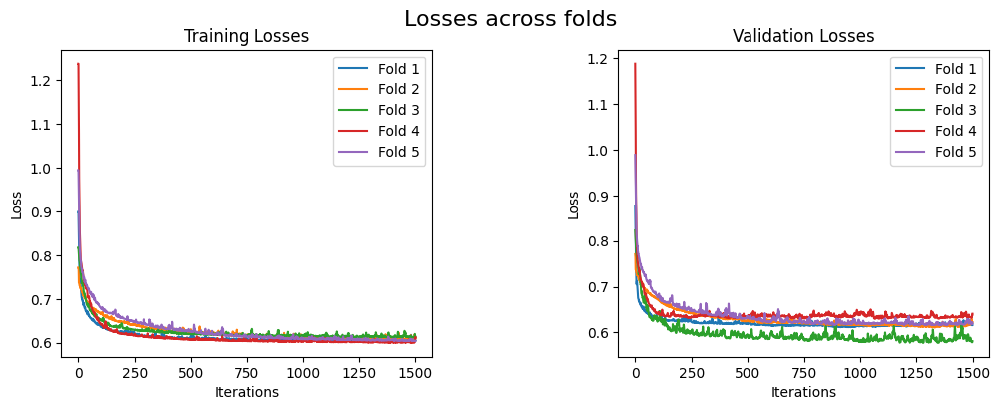

In [507]:
#plotting the loss across folds
fig,axes=plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)

fig.suptitle('Losses across folds', fontsize=16)

for i in range(K):
    axes[0].plot(training_losses[i])
    axes[1].plot(validation_losses[i])

axes[0].set_title("Training Losses")    
axes[0].set_xlabel("Iterations")
axes[0].set_ylabel("Loss")
axes[0].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

axes[1].set_title("Validation Losses")
axes[1].set_xlabel("Iterations")
axes[1].set_ylabel("Loss")
axes[1].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

plt.show()



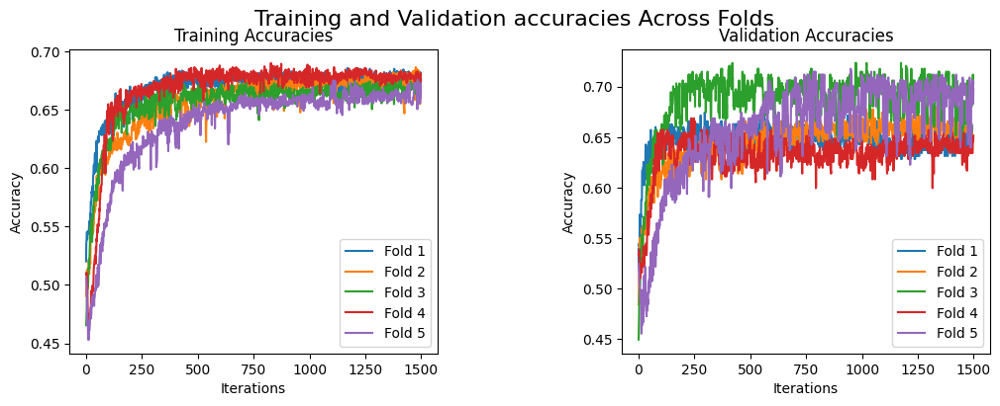

In [508]:
#plotting the accuracies across folds
fig,axes=plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)

fig.suptitle('Training and Validation accuracies Across Folds', fontsize=16)

for i in range(K):
    axes[0].plot(training_accuracies[i])
    axes[1].plot(validation_accuracies[i])

axes[0].set_title("Training Accuracies")
axes[0].set_xlabel("Iterations")
axes[0].set_ylabel("Accuracy")
axes[0].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

axes[1].set_title("Validation Accuracies")
axes[1].set_xlabel("Iterations")
axes[1].set_ylabel("Accuracy")
axes[1].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

plt.show()




Evaluating mini batch gradient descent with batch size 64

In [509]:
K=5
training_accuracies=[]
training_losses=[]
validation_accuracies=[]
validation_losses=[]
validation_precisions=[]
validation_accuracies=[]
validation_loss=[]
validation_accuracy=[]
validation_recalls=[]
validation_f1_score=[]
weights=[]

In [510]:
for i in range(K):
    X_val_new=X_train_Kfold[i*int(len(X_train_Kfold)/K):(i+1)*int(len(X_train_Kfold)/K)]
    Y_val_new=Y_train_Kfold[i*int(len(Y_train_Kfold)/K):(i+1)*int(len(Y_train_Kfold)/K)]
    X_train_new=np.concatenate((X_train_Kfold[:i*int(len(X_train_Kfold)/K)],X_train_Kfold[(i+1)*int(len(X_train_Kfold)/K):]),axis=0)
    Y_train_new=np.concatenate((Y_train_Kfold[:i*int(len(Y_train_Kfold)/K)],Y_train_Kfold[(i+1)*int(len(Y_train_Kfold)/K):]),axis=0)

    max=np.max(X_train_new,axis=0)
    min=np.min(X_train_new,axis=0)

    X_train_new=(X_train_new-min)/(max-min)
    X_val_new=(X_val_new-min)/(max-min)

    model_Kfold=LogisticRegression(eta=1e-2,iterations=1000, gradient_descent="MiniBatch",batch_size=64)
    model_Kfold.fit(X_train_new,Y_train_new,X_val_new,Y_val_new)

    training_accuracies.append(model_Kfold.accuracies)
    training_losses.append(model_Kfold.losses)
    validation_accuracies.append(model_Kfold.validation_accuracies)
    validation_losses.append(model_Kfold.validation_losses)


    cm=model_Kfold.confusion_matrix(X_val_new,Y_val_new)
    validation_precisions.append(model_Kfold.precision(cm))
    validation_recalls.append(model_Kfold.recall(cm))
    validation_f1_score.append(model_Kfold.f1_score(cm))
    validation_accuracy.append((cm[0][0]+cm[1][1])/np.sum(cm))
    validation_loss.append(model_Kfold.loss(model_Kfold.add_ones_column(X_val_new),Y_val_new))
    weights.append(model_Kfold.weights)

   

Iteration: 0, Training Loss: 1.3404664621916675, Training Accuracy: 0.5143884892086331
Iteration: 1, Training Loss: 1.167269816700088, Training Accuracy: 0.5143884892086331
Iteration: 2, Training Loss: 0.9761231018441952, Training Accuracy: 0.5115107913669065
Iteration: 3, Training Loss: 0.8706640500276772, Training Accuracy: 0.5086330935251798
Iteration: 4, Training Loss: 0.8246351213074822, Training Accuracy: 0.5179856115107914
Iteration: 5, Training Loss: 0.7929838907558415, Training Accuracy: 0.5093525179856115
Iteration: 6, Training Loss: 0.7817789108266212, Training Accuracy: 0.5079136690647482
Iteration: 7, Training Loss: 0.7708313616133449, Training Accuracy: 0.5050359712230216
Iteration: 8, Training Loss: 0.7531579461620498, Training Accuracy: 0.4848920863309353
Iteration: 9, Training Loss: 0.7435104798937306, Training Accuracy: 0.4949640287769784
Iteration: 10, Training Loss: 0.7456189562439267, Training Accuracy: 0.4906474820143885
Iteration: 11, Training Loss: 0.73541398657

In [511]:
training_accuracies=np.array(training_accuracies)
training_losses=np.array(training_losses)
validation_accuracies=np.array(validation_accuracies)
validation_losses=np.array(validation_losses)
losses=np.array(validation_loss)
precisions=np.array(validation_precisions)
recalls=np.array(validation_recalls)
f1_score=np.array(validation_f1_score)
accuracies=np.array(validation_accuracy)


In [512]:
print("Evaluation of MiniBatch Gradient Descent Model with batch size 64 on K Fold Cross Validation")

#displaying the average metrics across folds
print("=== Average Metrics Across Folds on validation data ===")
print("Accuracy:",np.mean(accuracies))
print("Loss:",np.mean(losses))   
print("Precision:",np.mean(precisions))
print("Recall:",np.mean(recalls))
print("F1 Score:",np.mean(f1_score, axis=0))

print("\n")
#displaying the standard deviation of metrics across folds
print("=== Standard deviation of Metrics Across Folds on validation data ===")
print("Accuracy:",np.std(accuracies))
print("Loss:",np.std(losses))
print("Precision:",np.std(precisions))
print("Recall:",np.std(recalls))
print("F1 Score:",np.std(f1_score, axis=0))

Evaluation of MiniBatch Gradient Descent Model with batch size 64 on K Fold Cross Validation
=== Average Metrics Across Folds on validation data ===
Accuracy: 0.6749279538904899
Loss: 0.6142119310372042
Precision: 0.6971829740655338
Recall: 0.6539600657628264
F1 Score: 0.6740522938370814


=== Standard deviation of Metrics Across Folds on validation data ===
Accuracy: 0.029468179898937644
Loss: 0.02061226342806289
Precision: 0.02515064737319201
Recall: 0.04635302316266976
F1 Score: 0.03001549617499514


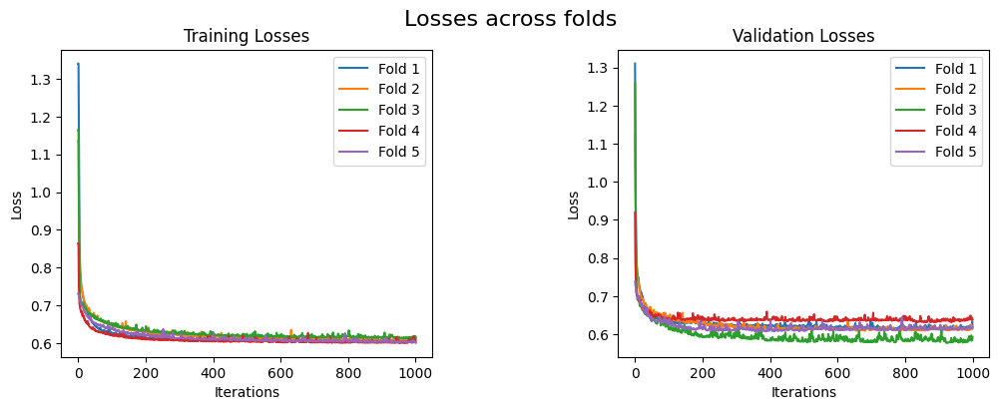

In [513]:
#plotting the loss across folds
fig,axes=plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)

fig.suptitle('Losses across folds', fontsize=16)

for i in range(K):
    axes[0].plot(training_losses[i])
    axes[1].plot(validation_losses[i])

axes[0].set_title("Training Losses")    
axes[0].set_xlabel("Iterations")
axes[0].set_ylabel("Loss")
axes[0].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

axes[1].set_title("Validation Losses")
axes[1].set_xlabel("Iterations")
axes[1].set_ylabel("Loss")
axes[1].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

plt.show()



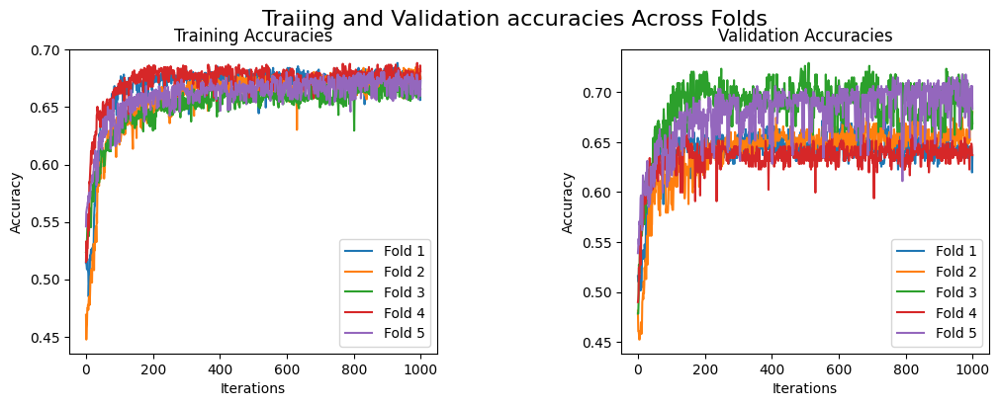

In [514]:
#plotting the accuracies across folds
fig,axes=plt.subplots(1,2,figsize=(12,4))
plt.subplots_adjust(hspace = 0.50)
plt.subplots_adjust(wspace = 0.50)

fig.suptitle('Traiing and Validation accuracies Across Folds', fontsize=16)

for i in range(K):
    axes[0].plot(training_accuracies[i])
    axes[1].plot(validation_accuracies[i])

axes[0].set_title("Training Accuracies")
axes[0].set_xlabel("Iterations")
axes[0].set_ylabel("Accuracy")
axes[0].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

axes[1].set_title("Validation Accuracies")
axes[1].set_xlabel("Iterations")
axes[1].set_ylabel("Accuracy")
axes[1].legend(["Fold 1","Fold 2","Fold 3","Fold 4","Fold 5"])

plt.show()




**Observation:**

We observe that the model trained with **Mini-Batch Gradient Descent** using a batch size of 32 achieves the **highest accuracy** and **F1 score** across the K-folds. Additionally, this model has a **lower standard deviation** in performance metrics compared to other models, indicating more consistent results.

Hence, we select this model as the **best model** for the given dataset.

Convergence Speeds:
1. **Batch Gradient Descent** converges in the **fewest number of iterations**.
2. **Mini-Batch Gradient Descent (batch size 32)** converges after a similar number of iterations but takes **slightly longer** than Batch Gradient Descent.
3. **Mini-Batch Gradient Descent (batch size 64)** requires more iterations to converge than Mini-Batch Gradient dscent of size 32..
4. **Stochastic Gradient Descent** converges in the **most number of iterations**.

Overall, we can conclude that the model trained with **Mini-Batch Gradient Descent** using a batch size of 32 is the **best model** for this dataset, as it not only provides the highest accuracy and F1 score but also converges relatively quickly with lower variation across folds.


-------------------------------------------------------------------------------------------------------------------

(f) **Implement early stopping in your best Gradient Descent method to avoid overfitting** 

Define and use appropriate stopping criteria. Experiment with different learning rates and regularization techniques (L1 and L2). Plot and compare the performance with and without early stopping. Analyze the effect of early stopping on overfitting and generalization

Implementing the best model without regularization and early stopping

In [515]:
"""     
Best Model: Logistic Regression with MiniBatch Gradient Descent, batch size 32, no early stopping
Data: Min-Max Scaled (Normalized)
"""

best_model=LogisticRegression(eta=1e-2,iterations=1500, gradient_descent="MiniBatch",batch_size=32, regularization=None, earlyStopping=False)
best_model.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 0.7195867893709383, Training Accuracy: 0.5234102026554857
Iteration: 1, Training Loss: 0.7126325469802429, Training Accuracy: 0.5317959468902865
Iteration: 2, Training Loss: 0.6929327993541096, Training Accuracy: 0.546470999301188
Iteration: 3, Training Loss: 0.6780840887888421, Training Accuracy: 0.5695317959468903
Iteration: 4, Training Loss: 0.6789777110964315, Training Accuracy: 0.5842068483577918
Iteration: 5, Training Loss: 0.6757708318244153, Training Accuracy: 0.5814116002795248
Iteration: 6, Training Loss: 0.6772586065101922, Training Accuracy: 0.573025856044724
Iteration: 7, Training Loss: 0.673385717365081, Training Accuracy: 0.5849056603773585
Iteration: 8, Training Loss: 0.673417188859813, Training Accuracy: 0.5863032844164919
Iteration: 9, Training Loss: 0.6709374902516364, Training Accuracy: 0.5877009084556254
Iteration: 10, Training Loss: 0.6703848307034073, Training Accuracy: 0.5918937805730259
Iteration: 11, Training Loss: 0.68152611241109

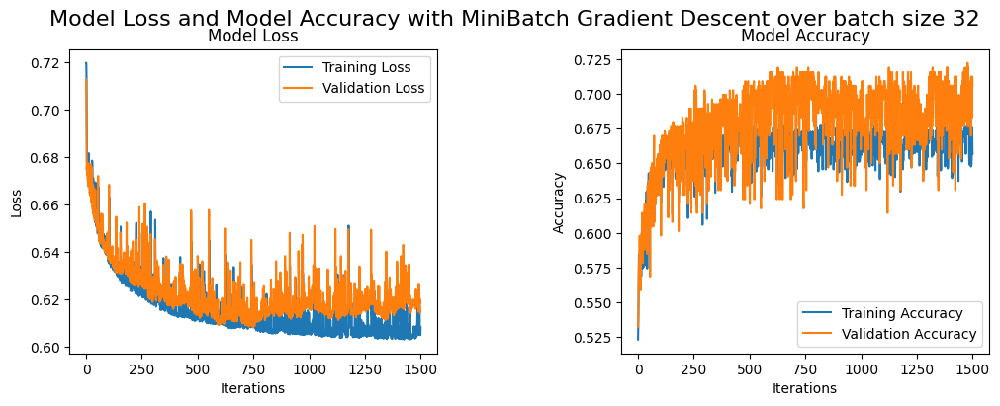

In [516]:
#plotting the model loss and model accuracy
best_model.plot_metrics("Model Loss and Model Accuracy with MiniBatch Gradient Descent over batch size 32")

=== Evaluating the Best Model on Validation Data ===
Accuracy: 0.7156862745098039
Precision: 0.7272727272727273
Recall: 0.7407407407407407
F1 Score: 0.7339449541284404


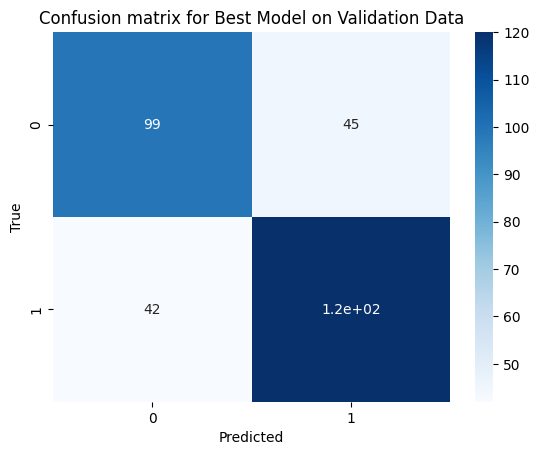

In [517]:
#evaluating the model on the validation set
print("=== Evaluating the Best Model on Validation Data ===")
cm_val_best_model=best_model.confusion_matrix(X_val_min_max,Y_val)
print("Accuracy:",(cm_val_best_model[0][0]+cm_val_best_model[1][1])/np.sum(cm_val_best_model))
print("Precision:",best_model.precision(cm_val_best_model))
print("Recall:",best_model.recall(cm_val_best_model))
print("F1 Score:",best_model.f1_score(cm_val_best_model))
best_model.plot_confusion_matrix(cm_val_best_model, "Confusion matrix for Best Model on Validation Data")

=== Evaluating the Best Model on Testing Data ===
Accuracy: 0.6547231270358306
Precision: 0.6447368421052632
Recall: 0.6533333333333333
F1 Score: 0.6490066225165563


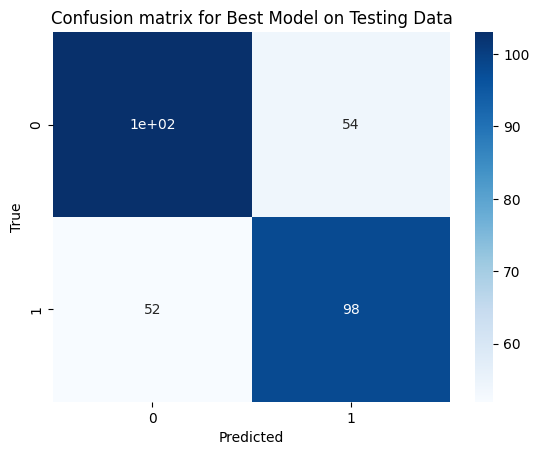

In [518]:
#evaluating the model on the testing set
print("=== Evaluating the Best Model on Testing Data ===")
cm_test_best_model=best_model.confusion_matrix(X_test_min_max,Y_test)
print("Accuracy:",(cm_test_best_model[0][0]+cm_test_best_model[1][1])/np.sum(cm_test_best_model))
print("Precision:",best_model.precision(cm_test_best_model))
print("Recall:",best_model.recall(cm_test_best_model))
print("F1 Score:",best_model.f1_score(cm_test_best_model))
best_model.plot_confusion_matrix(cm_test_best_model, "Confusion matrix for Best Model on Testing Data")

To mitigate the risk of overfitting that the earlier model might have experienced, we can implement **early stopping** as a regularization technique.

**Early Stopping Strategy**:
The criteria for early stopping are based on the **validation set** performance. We introduce a hyperparameter, `max-iterations`, which defines the number of iterations the model can go without an improvement in validation loss.

- **Validation Set Loss**: During training, if the validation loss **does not improve** for a specified number of iterations (defined by `max-iterations`), we assume the model is beginning to overfit.
- **Reverting to Best Weights**: When early stopping is triggered, the training process halts, and the model reverts to the weights that yielded the **best performance** on the validation set.

By using early stopping, we can prevent the model from continuing to train after it starts to overfit, thereby improving the model's generalization to unseen data.


In [519]:
best_model_early_stopping=LogisticRegression(eta=1e-2,iterations=1500, gradient_descent="MiniBatch",batch_size=32, regularization=None, earlyStopping=True, max_iters=50)
best_model_early_stopping.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 1.591171341923299, Training Accuracy: 0.5087351502445842
Iteration: 1, Training Loss: 1.2931421343271472, Training Accuracy: 0.4835779175401817
Iteration: 2, Training Loss: 1.1575565568825466, Training Accuracy: 0.4751921733053808
Iteration: 3, Training Loss: 1.1166411772025413, Training Accuracy: 0.47658979734451434
Iteration: 4, Training Loss: 1.102202845010802, Training Accuracy: 0.4758909853249476
Iteration: 5, Training Loss: 1.039400411004125, Training Accuracy: 0.48846960167714887
Iteration: 6, Training Loss: 1.0204567058181278, Training Accuracy: 0.48846960167714887
Iteration: 7, Training Loss: 1.0151646498966456, Training Accuracy: 0.49056603773584906
Iteration: 8, Training Loss: 1.0102929058980339, Training Accuracy: 0.4912648497554158
Iteration: 9, Training Loss: 1.0023551586754735, Training Accuracy: 0.493361285814116
Iteration: 10, Training Loss: 1.003384752537257, Training Accuracy: 0.493361285814116
Iteration: 11, Training Loss: 0.987245800228

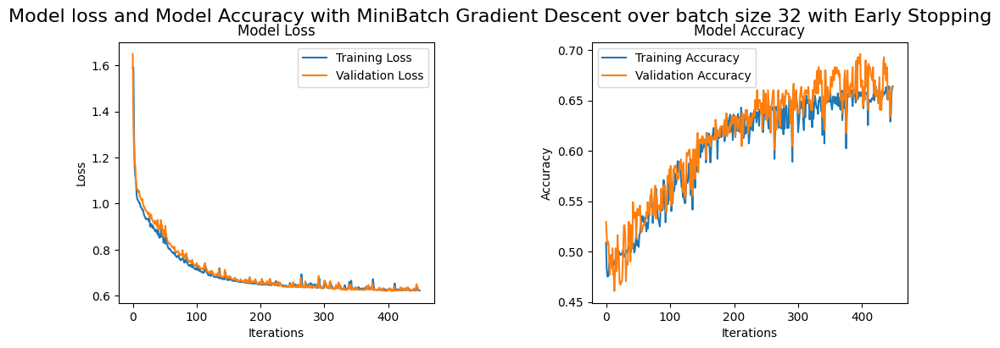

In [520]:
#plotting the curves
best_model_early_stopping.plot_metrics("Model loss and Model Accuracy with MiniBatch Gradient Descent over batch size 32 with Early Stopping")

**Observation:** The benefits of early stopping are evident when comparing the confusion matrix produced on the validation set with and without early stopping. Specifically, the **recall**, which is our primary focus (aiming to improve the true positive rate), has increased significantly. This improvement means the model is better at predicting positive samples, leading to an overall enhancement in performance.

By preventing overfitting, early stopping allows the model to generalize more effectively, resulting in a better balance between precision and recall.


=== Evaluating the Best Model with Early Stopping on Validation Data ===
Accuracy: 0.696078431372549
Precision: 0.7017543859649122
Recall: 0.7407407407407407
F1 Score: 0.7207207207207207


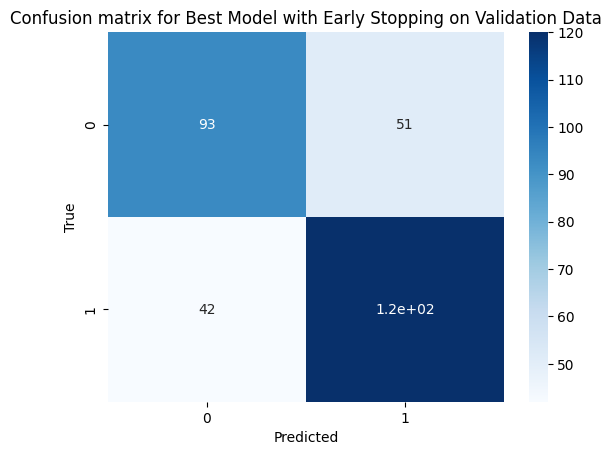

In [521]:
#evaluating the model on the validation set
print("=== Evaluating the Best Model with Early Stopping on Validation Data ===")
cm_val_best_model_early_stopping=best_model_early_stopping.confusion_matrix(X_val_min_max,Y_val)
print("Accuracy:",(cm_val_best_model_early_stopping[0][0]+cm_val_best_model_early_stopping[1][1])/np.sum(cm_val_best_model_early_stopping))
print("Precision:",best_model_early_stopping.precision(cm_val_best_model_early_stopping))
print("Recall:",best_model_early_stopping.recall(cm_val_best_model_early_stopping))
print("F1 Score:",best_model_early_stopping.f1_score(cm_val_best_model_early_stopping))
best_model_early_stopping.plot_confusion_matrix(cm_val_best_model_early_stopping, "Confusion matrix for Best Model with Early Stopping on Validation Data")

**we can also see that the model performs considerably well on testing data with respect to recognizing true positives implying that early stopping has indeed reduced overfitting making the model more general to unseen data**

=== Evaluating the Best Model with early stopping on Testing Data ===
Accuracy: 0.6514657980456026
Precision: 0.6319018404907976
Recall: 0.6866666666666666
F1 Score: 0.65814696485623


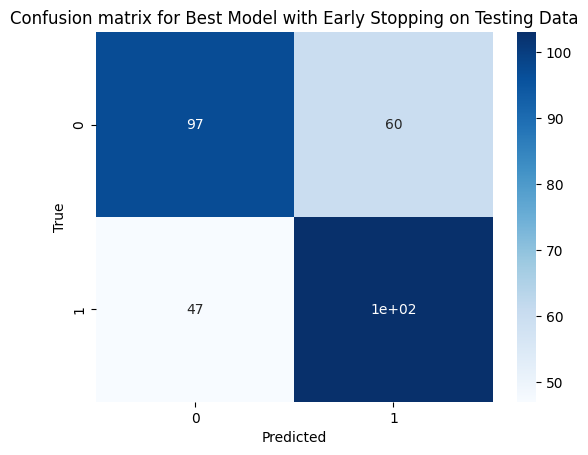

In [522]:
#evaluating the model on the testing set
print("=== Evaluating the Best Model with early stopping on Testing Data ===")
cm_test_best_model_early_stopping=best_model_early_stopping.confusion_matrix(X_test_min_max,Y_test)
print("Accuracy:",(cm_test_best_model_early_stopping[0][0]+cm_test_best_model_early_stopping[1][1])/np.sum(cm_test_best_model_early_stopping))
print("Precision:",best_model_early_stopping.precision(cm_test_best_model_early_stopping))
print("Recall:",best_model_early_stopping.recall(cm_test_best_model_early_stopping))
print("F1 Score:",best_model_early_stopping.f1_score(cm_test_best_model_early_stopping))
best_model_early_stopping.plot_confusion_matrix(cm_test_best_model_early_stopping, "Confusion matrix for Best Model with Early Stopping on Testing Data")

Experimenting with different learning rates and regularization techniques (L1 and L2)

In [542]:
"""
BestModel 1: Logistic Regression with MiniBatch Gradient Descent, batch size 32, L1 Regularization, lambda=0.01, No Early Stopping
"""
best_model_1=LogisticRegression(eta=1e-2,iterations=1500, gradient_descent="MiniBatch", regularization="L1", lambda_val=0.01, batch_size=32, earlyStopping=False)
best_model_1.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 0.9314417970770429, Training Accuracy: 0.44095038434661077
Iteration: 1, Training Loss: 0.925851946341952, Training Accuracy: 0.4416491963661775
Iteration: 2, Training Loss: 0.9165322265632302, Training Accuracy: 0.4556254367575122
Iteration: 3, Training Loss: 0.9028653175051178, Training Accuracy: 0.453529000698812
Iteration: 4, Training Loss: 0.9022228875018196, Training Accuracy: 0.4444444444444444
Iteration: 5, Training Loss: 0.8880114844657764, Training Accuracy: 0.4584206848357792
Iteration: 6, Training Loss: 0.8796928489237712, Training Accuracy: 0.4605171208944794
Iteration: 7, Training Loss: 0.8727310786469062, Training Accuracy: 0.46820405310971347
Iteration: 8, Training Loss: 0.8707806200084746, Training Accuracy: 0.4856743535988819
Iteration: 9, Training Loss: 0.8718564978147281, Training Accuracy: 0.49406009783368277
Iteration: 10, Training Loss: 0.8587998978365884, Training Accuracy: 0.47868623340321453
Iteration: 11, Training Loss: 0.87159647

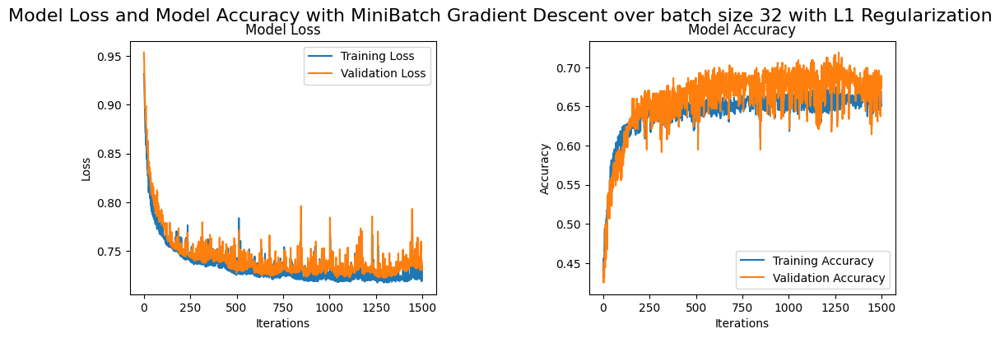

In [543]:
best_model_1.plot_metrics("Model Loss and Model Accuracy with MiniBatch Gradient Descent over batch size 32 with L1 Regularization")

=== Evaluating the Best Model 1 on Validation Data ===
Accuracy: 0.6895424836601307
Precision: 0.6850828729281768
Recall: 0.7654320987654321
F1 Score: 0.7230320699708455


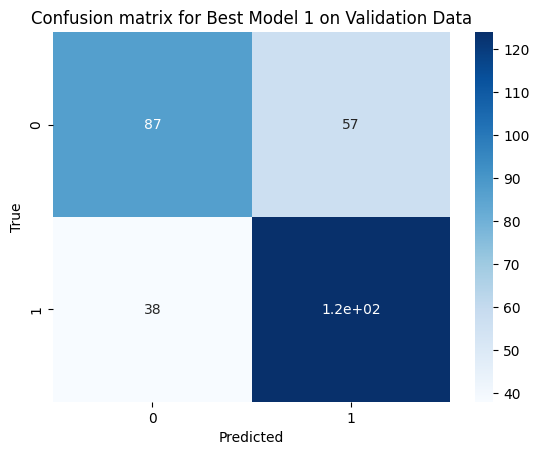

In [545]:
#evaluating the model on the validation set
print("=== Evaluating the Best Model 1 on Validation Data ===")
cm_val_best_model_1=best_model_1.confusion_matrix(X_val_min_max,Y_val)
print("Accuracy:",(cm_val_best_model_1[0][0]+cm_val_best_model_1[1][1])/np.sum(cm_val_best_model_1))
print("Precision:",best_model_1.precision(cm_val_best_model_1))
print("Recall:",best_model_1.recall(cm_val_best_model_1))
print("F1 Score:",best_model_1.f1_score(cm_val_best_model_1))
best_model_1.plot_confusion_matrix(cm_val_best_model_1, "Confusion matrix for Best Model 1 on Validation Data")


In [546]:
"""    
BestModel 2: Logistic Regression with MiniBatch Gradient Descent, batch size 32, L1 Regularization, lambda=0.01, With Early Stopping
"""
best_model_2=LogisticRegression(eta=1e-2,iterations=1500, gradient_descent="MiniBatch", regularization="L1", lambda_val=0.01, batch_size=32, earlyStopping=True, max_iters=50)
best_model_2.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 0.9629050971151115, Training Accuracy: 0.3941299790356394
Iteration: 1, Training Loss: 0.9501405741227168, Training Accuracy: 0.3976240391334731
Iteration: 2, Training Loss: 0.9264233625801417, Training Accuracy: 0.40111809923130676
Iteration: 3, Training Loss: 0.9136820005260529, Training Accuracy: 0.4185883997204752
Iteration: 4, Training Loss: 0.9081792196319455, Training Accuracy: 0.41020265548567436
Iteration: 5, Training Loss: 0.901030035294785, Training Accuracy: 0.4025157232704403
Iteration: 6, Training Loss: 0.8859698293269206, Training Accuracy: 0.4053109713487072
Iteration: 7, Training Loss: 0.8761807798322051, Training Accuracy: 0.4053109713487072
Iteration: 8, Training Loss: 0.8637906230322687, Training Accuracy: 0.4143955276030748
Iteration: 9, Training Loss: 0.8518272741553303, Training Accuracy: 0.416491963661775
Iteration: 10, Training Loss: 0.8551690861864565, Training Accuracy: 0.4360587002096436
Iteration: 11, Training Loss: 0.8348030516

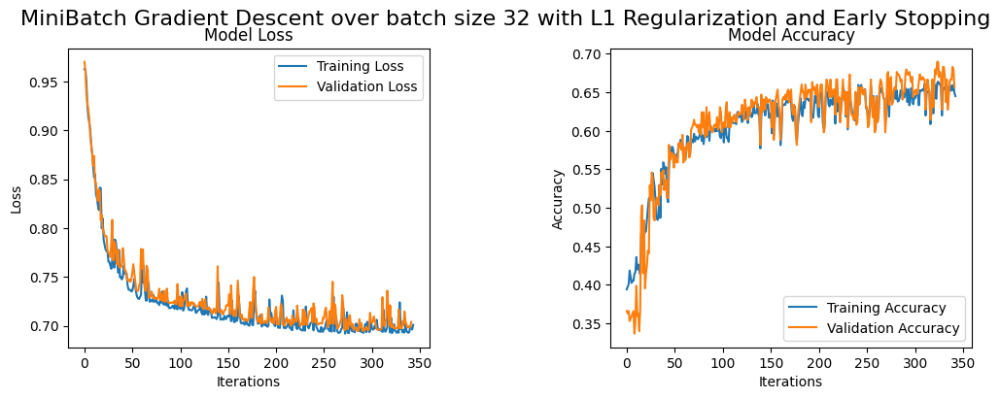

In [547]:
best_model_2.plot_metrics("MiniBatch Gradient Descent over batch size 32 with L1 Regularization and Early Stopping")

=== Evaluating the Best Model 2 on Validation Data ===
Accuracy: 0.6797385620915033
Precision: 0.6720430107526881
Recall: 0.7716049382716049
F1 Score: 0.7183908045977012


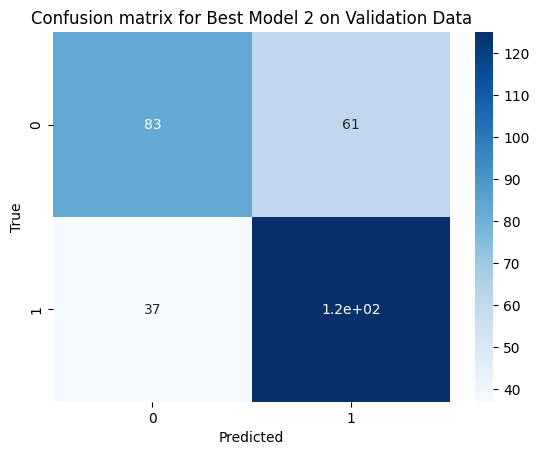

In [548]:
#evaluating the model on the validation set
print("=== Evaluating the Best Model 2 on Validation Data ===")
cm_val_best_model_2=best_model_2.confusion_matrix(X_val_min_max,Y_val)
print("Accuracy:",(cm_val_best_model_2[0][0]+cm_val_best_model_2[1][1])/np.sum(cm_val_best_model_2))
print("Precision:",best_model_2.precision(cm_val_best_model_2))
print("Recall:",best_model_2.recall(cm_val_best_model_2))
print("F1 Score:",best_model_2.f1_score(cm_val_best_model_2))
best_model_2.plot_confusion_matrix(cm_val_best_model_2, "Confusion matrix for Best Model 2 on Validation Data")


In [551]:
"""    
BestModel3: Logistic Regression with MiniBatch Gradient Descent, batch size 32, L2 Regularization, No Early Stopping
Experimenting with a different learning rate
"""
best_model_3=LogisticRegression(eta=1e-2,iterations=1500, gradient_descent="MiniBatch", regularization="L2", lambda_val=0.05,batch_size=32, earlyStopping=False)
best_model_3.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 3.738630447067633, Training Accuracy: 0.48846960167714887
Iteration: 1, Training Loss: 2.9452833414248722, Training Accuracy: 0.4919636617749825
Iteration: 2, Training Loss: 2.4920953543853717, Training Accuracy: 0.5003494060097834
Iteration: 3, Training Loss: 2.254568692155255, Training Accuracy: 0.5038434661076171
Iteration: 4, Training Loss: 1.9166174341074922, Training Accuracy: 0.5234102026554857
Iteration: 5, Training Loss: 1.7923167762547287, Training Accuracy: 0.5129280223619846
Iteration: 6, Training Loss: 1.7292635273943637, Training Accuracy: 0.5045422781271838
Iteration: 7, Training Loss: 1.6851237220908517, Training Accuracy: 0.4996505939902166
Iteration: 8, Training Loss: 1.642604034307879, Training Accuracy: 0.5017470300489169
Iteration: 9, Training Loss: 1.6152195919565648, Training Accuracy: 0.5150244584206848
Iteration: 10, Training Loss: 1.623837864100821, Training Accuracy: 0.5241090146750524
Iteration: 11, Training Loss: 1.5827884079757

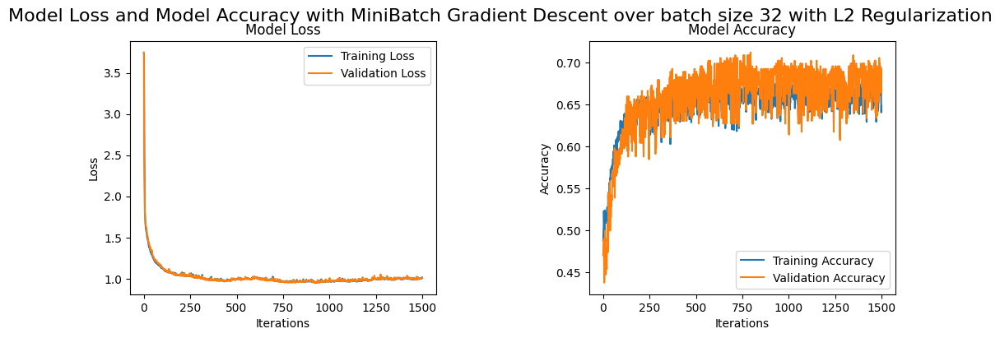

In [552]:
best_model_3.plot_metrics("Model Loss and Model Accuracy with MiniBatch Gradient Descent over batch size 32 with L2 Regularization")

=== Evaluating the Best Model 3 on Validation Data ===
Accuracy: 0.6993464052287581
Precision: 0.7134146341463414
Recall: 0.7222222222222222
F1 Score: 0.7177914110429447


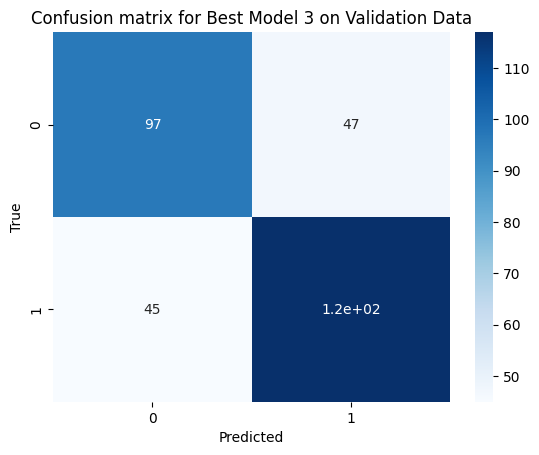

In [553]:
#evaluating the model on the validation set
print("=== Evaluating the Best Model 3 on Validation Data ===")
cm_val_best_model_3=best_model_3.confusion_matrix(X_val_min_max,Y_val)
print("Accuracy:",(cm_val_best_model_3[0][0]+cm_val_best_model_3[1][1])/np.sum(cm_val_best_model_3))
print("Precision:",best_model_3.precision(cm_val_best_model_3))
print("Recall:",best_model_3.recall(cm_val_best_model_3))
print("F1 Score:",best_model_3.f1_score(cm_val_best_model_3))
best_model_3.plot_confusion_matrix(cm_val_best_model_3, "Confusion matrix for Best Model 3 on Validation Data")


In [554]:
"""     
BestModel4: Logistic Regression with MiniBatch Gradient Descent, batch size 32, L2 Regularization, lambda=0.001, With Early Stopping
"""
best_model_4=LogisticRegression(eta=1e-3,iterations=1000, gradient_descent="MiniBatch", regularization="L2", lambda_val=0.01, batch_size=32, earlyStopping=True, max_iters=50)
best_model_4.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 2.7321675997588395, Training Accuracy: 0.4919636617749825
Iteration: 1, Training Loss: 2.7066715871359595, Training Accuracy: 0.49056603773584906
Iteration: 2, Training Loss: 2.6710482593200116, Training Accuracy: 0.48986722571628233
Iteration: 3, Training Loss: 2.6231355500273676, Training Accuracy: 0.48986722571628233
Iteration: 4, Training Loss: 2.5968657071459433, Training Accuracy: 0.48707197763801535
Iteration: 5, Training Loss: 2.5672799154531756, Training Accuracy: 0.4856743535988819
Iteration: 6, Training Loss: 2.5306445487565448, Training Accuracy: 0.48497554157931516
Iteration: 7, Training Loss: 2.4872902784743567, Training Accuracy: 0.48427672955974843
Iteration: 8, Training Loss: 2.4585777837242726, Training Accuracy: 0.48287910552061497
Iteration: 9, Training Loss: 2.4237767524904923, Training Accuracy: 0.47938504542278126
Iteration: 10, Training Loss: 2.3799920338177576, Training Accuracy: 0.480083857442348
Iteration: 11, Training Loss: 2.348

**Observation:** With a **lower learning rate** and the use of **L2 regularization**, early stopping was never triggered. This implies that the **L2 regularization** effectively controlled overfitting by penalizing large weights, resulting in smoother convergence.

The combination of a reduced learning rate and L2 regularization allowed the model to train without hitting the early stopping criterion, as it prevented the validation loss from increasing due to overfitting. As a result, the model maintained steady improvement in both training and validation performance throughout the training process.


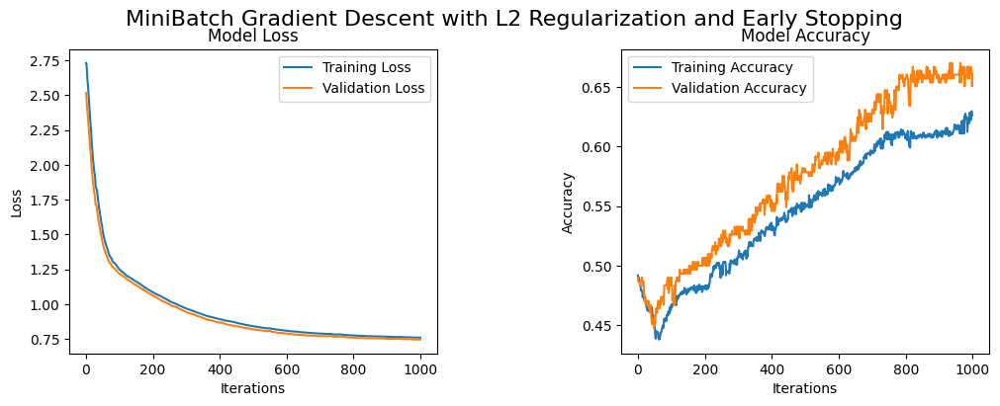

In [555]:
best_model_4.plot_metrics("MiniBatch Gradient Descent with L2 Regularization and Early Stopping")

**Observation:** While the lower learning rate helped control overfitting, it has resulted in **lower precision** compared to earlier models. This suggests that the model may be underfitting the data, indicating the need for a **higher learning rate** for this specific dataset to achieve better precision and overall performance.


=== Evaluating the Best Model 4 on Validation Data ===
Accuracy: 0.6633986928104575
Precision: 0.697986577181208
Recall: 0.6419753086419753
F1 Score: 0.6688102893890675


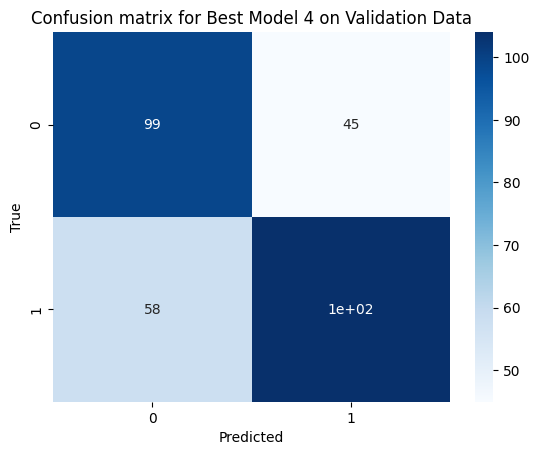

In [556]:
#evaluating the model on the validation set
print("=== Evaluating the Best Model 4 on Validation Data ===")
cm_val_best_model_4=best_model_4.confusion_matrix(X_val_min_max,Y_val)
print("Accuracy:",(cm_val_best_model_4[0][0]+cm_val_best_model_4[1][1])/np.sum(cm_val_best_model_4))
print("Precision:",best_model_4.precision(cm_val_best_model_4))
print("Recall:",best_model_4.recall(cm_val_best_model_4))
print("F1 Score:",best_model_4.f1_score(cm_val_best_model_4))
best_model_4.plot_confusion_matrix(cm_val_best_model_4, "Confusion matrix for Best Model 4 on Validation Data")

In [563]:
"""     
BestModel5: Logistic Regression with MiniBatch Gradient Descent, batch size 32, L2 Regularization, lambda=0.01, With early stopping
Increasing the learning rate
"""
best_model_5=LogisticRegression(eta=1e-2,iterations=1500, gradient_descent="MiniBatch", regularization="L2", lambda_val=0.01, batch_size=32, earlyStopping=True, max_iters=50)
best_model_5.fit(X_train_min_max,Y_train,X_val_min_max,Y_val)

Iteration: 0, Training Loss: 0.9176152587514327, Training Accuracy: 0.5017470300489169
Iteration: 1, Training Loss: 0.9140910480678927, Training Accuracy: 0.5087351502445842
Iteration: 2, Training Loss: 0.9132710715964268, Training Accuracy: 0.517120894479385
Iteration: 3, Training Loss: 0.917101574232252, Training Accuracy: 0.527603074772886
Iteration: 4, Training Loss: 0.8951748234534619, Training Accuracy: 0.5241090146750524
Iteration: 5, Training Loss: 0.8792240184422758, Training Accuracy: 0.5192173305380853
Iteration: 6, Training Loss: 0.8645568622288855, Training Accuracy: 0.5087351502445842
Iteration: 7, Training Loss: 0.859564394868507, Training Accuracy: 0.5003494060097834
Iteration: 8, Training Loss: 0.848395129164257, Training Accuracy: 0.5073375262054507
Iteration: 9, Training Loss: 0.8460600857521364, Training Accuracy: 0.5192173305380853
Iteration: 10, Training Loss: 0.8417756869929977, Training Accuracy: 0.5373864430468204
Iteration: 11, Training Loss: 0.836698371158441

**Observation:** On increasing the learning rate, the criterion for early stopping got triggered indicating that the model has started to overfit after a certain number of iterations.

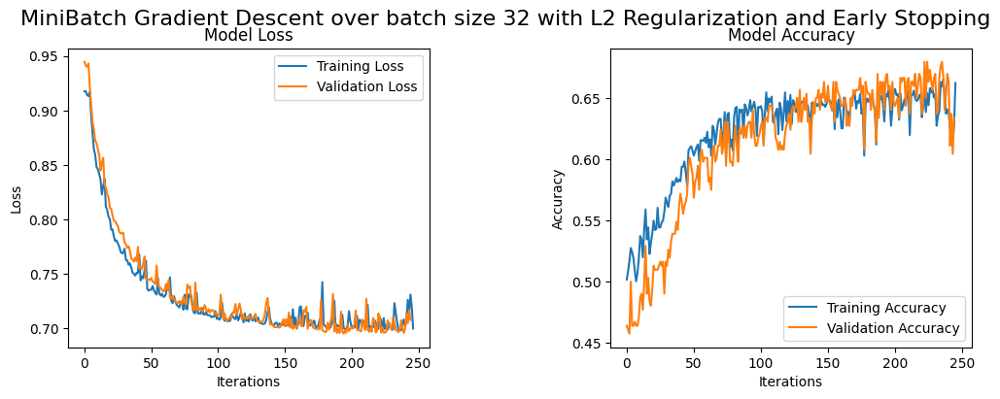

In [564]:
#plotting the model loss and model accuracy
best_model_5.plot_metrics("MiniBatch Gradient Descent over batch size 32 with L2 Regularization and Early Stopping")

**Early stopping has indeed reduced overfitting and improved the performance of the model.**

=== Evaluating the Best Model 5 on Validation Data ===
Accuracy: 0.6699346405228758
Precision: 0.6826347305389222
Recall: 0.7037037037037037
F1 Score: 0.6930091185410334


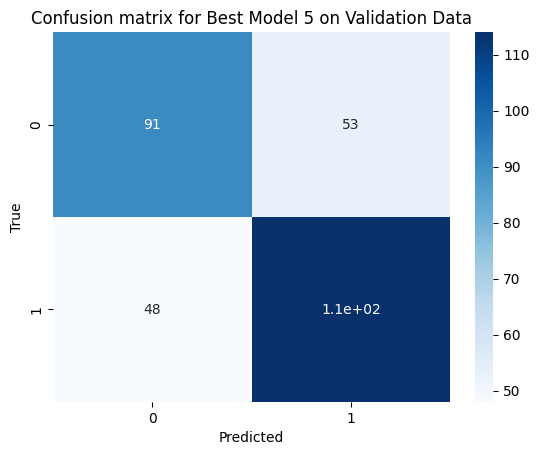

In [565]:
#evaluating the model on the validation set
print("=== Evaluating the Best Model 5 on Validation Data ===")
cm_val_best_model_5=best_model_5.confusion_matrix(X_val_min_max,Y_val)
print("Accuracy:",(cm_val_best_model_5[0][0]+cm_val_best_model_5[1][1])/np.sum(cm_val_best_model_5))
print("Precision:",best_model_5.precision(cm_val_best_model_5))
print("Recall:",best_model_5.recall(cm_val_best_model_5))
print("F1 Score:",best_model_5.f1_score(cm_val_best_model_5))
best_model_5.plot_confusion_matrix(cm_val_best_model_5, "Confusion matrix for Best Model 5 on Validation Data")


Comparing the performances of different models

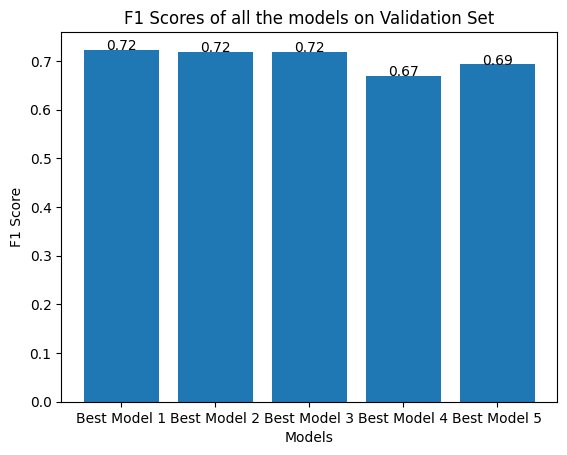

In [566]:
#plotting f1 scores of all the models on the validation set on the same plot
f1_scores=[best_model_1.f1_score(cm_val_best_model_1),best_model_2.f1_score(cm_val_best_model_2),best_model_3.f1_score(cm_val_best_model_3),best_model_4.f1_score(cm_val_best_model_4),best_model_5.f1_score(cm_val_best_model_5)]
models=["Best Model 1","Best Model 2","Best Model 3","Best Model 4","Best Model 5"]
plt.bar(models,f1_scores)
plt.xlabel("Models")
plt.ylabel("F1 Score")
plt.title("F1 Scores of all the models on Validation Set")
#annotate on top of the bars
for i in range(len(f1_scores)):
    plt.text(i,f1_scores[i],str(round(f1_scores[i],2)),ha='center')
plt.show()


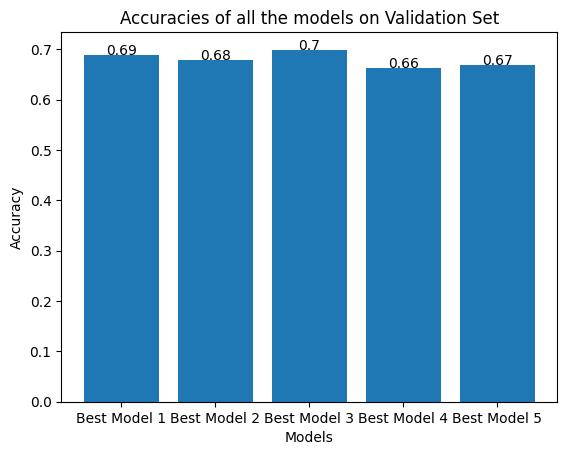

In [567]:
#plotting accuracies of all the models on the validation set on the same plot
accuracies=[(cm_val_best_model_1[0][0]+cm_val_best_model_1[1][1])/np.sum(cm_val_best_model_1),(cm_val_best_model_2[0][0]+cm_val_best_model_2[1][1])/np.sum(cm_val_best_model_2),(cm_val_best_model_3[0][0]+cm_val_best_model_3[1][1])/np.sum(cm_val_best_model_3),(cm_val_best_model_4[0][0]+cm_val_best_model_4[1][1])/np.sum(cm_val_best_model_4),(cm_val_best_model_5[0][0]+cm_val_best_model_5[1][1])/np.sum(cm_val_best_model_5)]
models=["Best Model 1","Best Model 2","Best Model 3","Best Model 4","Best Model 5"]
plt.bar(models,accuracies)
plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Accuracies of all the models on Validation Set")
for i in range(len(accuracies)):
    plt.text(i,accuracies[i],str(round(accuracies[i],2)),ha='center')

plt.show()

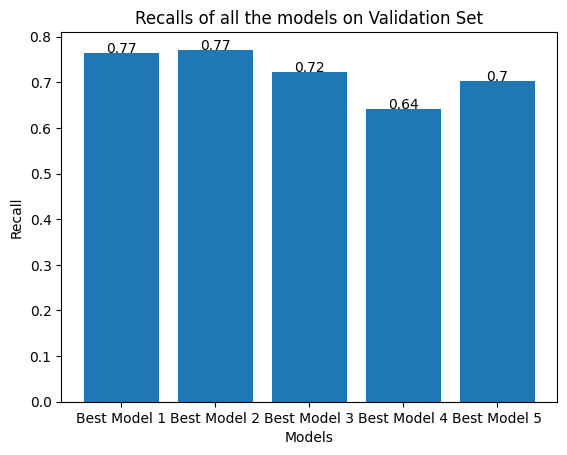

In [568]:
# plotting recall of all the models on the validation set on the same plot
recalls=[best_model_1.recall(cm_val_best_model_1),best_model_2.recall(cm_val_best_model_2),best_model_3.recall(cm_val_best_model_3),best_model_4.recall(cm_val_best_model_4),best_model_5.recall(cm_val_best_model_5)]
models=["Best Model 1","Best Model 2","Best Model 3","Best Model 4","Best Model 5"]
plt.bar(models,recalls)
plt.xlabel("Models")
plt.ylabel("Recall")
plt.title("Recalls of all the models on Validation Set")
for i in range(len(recalls)):
    plt.text(i,recalls[i],str(round(recalls[i],2)),ha='center')

plt.show()

Since we are predicting HeartDisease, `Recall` becomes the most important criteria to determine the performance of the model. We choose the model that has given the best results on the validation set. So we evaluate that on test set now.

Model: Logistic Regression, Learning rate (eta): 0.01, Iterations: 1500, Gradient Descent: MiniBatch, Regularization: L1, Lambda: 0.01, Batch Size: 32
=== Evaluating the Best Model on Testing Data ===
Accuracy: 0.6547231270358306
Precision: 0.6170212765957447
Recall: 0.7733333333333333
F1 Score: 0.6863905325443787


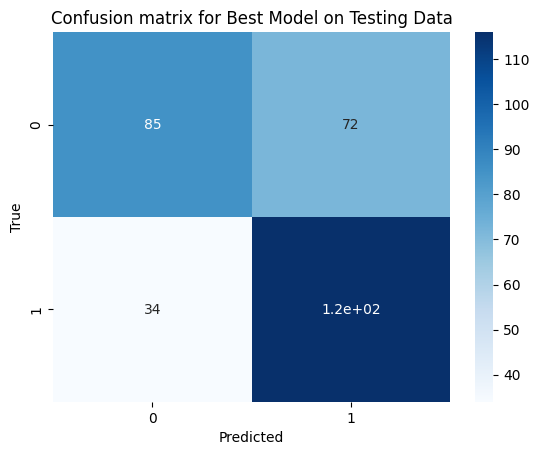

In [587]:
#choose the model with highest recall
best_model_index=np.argmax(recalls)
best_model=[best_model_1,best_model_2,best_model_3,best_model_4,best_model_5][best_model_index]
print(best_model)
#evaluating the best model on the testing set
print("=== Evaluating the Best Model on Testing Data ===")
cm_test_best_model=best_model.confusion_matrix(X_test_min_max,Y_test)
print("Accuracy:",(cm_test_best_model[0][0]+cm_test_best_model[1][1])/np.sum(cm_test_best_model))
print("Precision:",best_model.precision(cm_test_best_model))
print("Recall:",best_model.recall(cm_test_best_model))
print("F1 Score:",best_model.f1_score(cm_test_best_model))
# print("F1 Score:",best_model.f1_score(cm_test_best_model))
best_model.plot_confusion_matrix(cm_test_best_model, "Confusion matrix for Best Model on Testing Data")
# best_model.plot_confusion_matrix(cm_test_best_model, "Confusion matrix for Best Model on Testing Data")


**Observation:** Early stopping helps in reducing overfitting by halting the training process when the validation loss fails to improve after a certain number of iterations. This prevents the model from continuing to learn patterns that may only exist in the training set, thus reducing overfitting. 

By stopping training at the point where the model starts to overfit, early stopping ensures better generalization on unseen data, balancing both validation performance and training progress.


-----------------------------------------